# Run this in python 3!

In [1]:
from IPython.display import display
from IPython.display import HTML
import IPython.core.display as di # Example: di.display_html('<h3>%s:</h3>' % str, raw=True)

# This line will hide code by default when the notebook is exported as HTML
di.display_html('<script>jQuery(function() {if (jQuery("body.notebook_app").length == 0) { jQuery(".input_area").toggle(); jQuery(".prompt").toggle();}});</script>', raw=True)

# This line will add a button to toggle visibility of code blocks, for use with the HTML export version
di.display_html('''<button onclick="jQuery('.input_area').toggle(); jQuery('.prompt').toggle();">Toggle code</button>''', raw=True)


Toggle code

In [2]:
# all modules necessary for this nb
import os
import sys
import pickle
import math

import numpy as np
import pylab as pl
import scipy.stats as sstats

# setting parameters for default matplotlib plots
%matplotlib inline

#this will cause text to be exported as 'true text' which can be edited in Adobe Illustrator
pl.rcParams['pdf.fonttype']=42
pl.rcParams['ps.fonttype']=42

In [3]:
pl.style.use('fabiostyle')
# needs to find the library of functions
sys.path.append('../../code/')  # to be replaced!

import utils_python3 as ut
import plots_python3 as pt

In [4]:
#%%javascript
#var nb = IPython.notebook;
#var kernel = IPython.notebook.kernel;
#var command = "NOTEBOOK_NAME = '" + nb.base_url + nb.notebook_path + "'";
#kernel.execute(command);

In [5]:
NOTEBOOK_NAME = 'autocorrelations_vhpc_python3'

In [6]:
from pickleshare import PickleShareDB

autorestore_folder = os.path.join(os.getcwd(), 'autorestore', NOTEBOOK_NAME)
db = PickleShareDB(autorestore_folder)
import sys
from workspace import *
import IPython
ip = IPython.get_ipython()

# this will restore all the saved variables. ignore the errors listed.
load_workspace(ip, db)

# use `save_worspace(db)` to save variables at the end

In [7]:
all_animals  = np.loadtxt('../allmice.txt', dtype=str)
expo_animals = np.loadtxt('../expo_mice.txt', dtype=str)
pre_animals  = np.loadtxt('../pre_mice.txt', dtype=str)
d2_animals =  'c3f3','c3f2','c3m1', 'c3m2', 'c4m3', 'c4m4', 'c10m8', '90', '91', '92','93'
post_animals = np.loadtxt('../post_mice.txt', dtype=str)
renew_animals ='c3f3','c3f2','c3m1', 'c3m2', 'c4m3',         'c10m8', '90', '91', '92','93','91b','92b','93b'
ext2_animals = np.loadtxt('../ext2_mice.txt', dtype=str)
ext1_animals = np.loadtxt('../ext1_mice.txt', dtype=str)

In [8]:
sessions = 'expo', 'pre','d2', 'post', 'ext1', 'ext2', 'renew'
session_labels = 'Pre','Early','Day2','Late','Ext1','Ext2','Reinstate'
dark_co = ('forestgreen','darkcyan','tab:purple','firebrick','lightgrey','dimgrey','goldenrod')

In [30]:
def load_variable(name, folder='./'):
    with open(os.path.join(folder, name)) as f:
        toret = pickle.load(bytes(f, 'latin-1'))
    return toret

In [31]:
load_variable('events','../c3m2/pre/notebooks/autorestore/preprocessing/')

TypeError: encoding without a string argument

In [9]:
for sess in sessions[1:]:
    exec("%s_anivars = {}"%sess)
    for animal in eval("%s_animals"%sess):
        
        exec("vars_%s = {}"%sess)
        folder = '../%s/%s/notebooks/autorestore/preprocessing/' % (animal,sess)
        for var in ('time_ax', 'time_ax_single', 'events', 'cycles', 'is_CSmt', 'is_rewardt',
                    'traces','traces_raw', 'CYCLE_START', 'CS_DURATION'): 
            eval("vars_%s"%sess).update({var:ut.load_variable(var, folder=folder)})
        #eval("vars_%s"%sess).update({'time_ax_single_trunc':time_ax_single[11:]}) # create time_ax_sigle where fiirst ~3s are truncated
            
        eval("%s_anivars"%sess).update({animal:{}})
        eval("%s_anivars[animal]"%(sess)).update({eval("'vars_%s'"%sess):eval("vars_%s"%sess)})

    
    #    cellregs = dict(zip(conditions, [ut.load_cellreg_dict('../%s/data/cellreg_dict.txt' % animal, c) for c in conditions]))
    #    anivars[animal].update({'cellregs':cellregs})

UnicodeDecodeError: 'utf-8' codec can't decode byte 0x80 in position 0: invalid start byte

In [10]:
for sess in ['expo']:
    exec("%s_anivars = {}"%sess)
    for animal in eval("%s_animals"%sess):
        exec("vars_%s = {}"%sess)
        folder = '../%s/2_odor_expo/notebooks/autorestore/preprocessing/' % (animal)
        for var in ('time_ax', 'time_ax_single', 'events', 'cycles', 'is_CSmt', 'is_rewardt',
                    'traces','traces_raw', 'CYCLE_START', 'CS_DURATION'): 
            eval("vars_%s"%sess).update({var:ut.load_variable(var, folder=folder)})
        #eval("vars_%s"%sess).update({'time_ax_single_trunc':time_ax_single[11:]}) # create time_ax_sigle where fiirst ~3s are truncated

        eval("%s_anivars"%sess).update({animal:{}})
        eval("%s_anivars[animal]"%(sess)).update({eval("'vars_%s'"%sess):eval("vars_%s"%sess)})

UnicodeDecodeError: 'utf-8' codec can't decode byte 0x80 in position 0: invalid start byte

### make list of events with the following example structure:  all_amps_d2_CSm_evs[anis][cells][trials][time bins]

In [14]:
for sess in sessions:
    exec("all_amps_%s_CSm_evs=[]"%sess)
    exec("all_amps_%s_Rew_evs=[]"%sess)
    for animal in eval("%s_animals"%sess):
    #    cellregs = anivars[animal]['cellregs']
        exec("vars_%s = %s_anivars['%s']['vars_%s']"%(sess,sess,animal,sess))
    
        for k in eval("vars_%s.keys()"%sess):
            exec('%s = vars_%s[\'%s\']' % (k,sess,k))
    
        exec("amp_%s_CSm_evs = np.r_[[ut.compute_all_dffs(time_ax, events, cell, cycles[is_CSmt], time_ax_single)\
                        for cell in range(len(vars_%s['events'][0]))]]"%(sess,sess))
        #exec("amp_%s_CSm_evs = np.r_[[h for h in amp_%s_CSm_evs]]"%(sess,sess))
        #exec("amp_%s_CSm_evs = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in amp_%s_CSm_evs]]"%(sess,sess))
        exec("amp_%s_Rew_evs = np.r_[[ut.compute_all_dffs(time_ax, events, cell, cycles[is_rewardt], time_ax_single)\
                        for cell in range(len(vars_%s['events'][0]))]]"%(sess,sess))
        #exec("amp_%s_Rew_evs = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in amp_%s_Rew_evs]]"%(sess,sess))
        
        eval("all_amps_%s_CSm_evs.append(amp_%s_CSm_evs)"%(sess, sess))
        eval("all_amps_%s_Rew_evs.append(amp_%s_Rew_evs)"%(sess, sess))

In [20]:
len(all_amps_d2_CSm_evs[0][0][0])

48

In [27]:
#import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf

#calculate autocorrelations
#sm.tsa.acf(all_amps_d2_CSm_evs[0][0][0])

ImportError: cannot import name datetools

#### all_amps_d2_CSm_evs[anis][cells][trials][time bins]

In [22]:
# make list of all events across all animals, cells, (will wanna restrict time bins to baseline or trial periods later)
for tt in ['CSm','Rew']:
    for sess in sessions:
        exec("all_%s_%s_evs=[]"%(sess,tt))
        for ani in range(len(eval("all_amps_%s_%s_evs"%(sess,tt)))):
            #print i, all_amps_d2_CSm_evs[i]
            for cell in range(len(eval("all_amps_%s_%s_evs[ani]"%(sess,tt)))):
                exec("all_%s_%s_evs[trial].append(tb)"%(sess,tt))
                
                for trial in range(len(eval("all_amps_%s_%s_evs[ani][cell]"%(sess,tt)))):
                    for tb in eval("all_amps_%s_%s_evs[ani][cell][trial]"%(sess,tt)):
                        if tb > 0.0:

NameError: name 'tb' is not defined

In [15]:
# make list of all events across all animals, cells, trials, time bins by session.
for tt in ['CSm','Rew']:
    for sess in sessions:
        exec("all_%s_%s_evs=[]"%(sess,tt))
        for ani in range(len(eval("all_amps_%s_%s_evs"%(sess,tt)))):
            #print i, all_amps_d2_CSm_evs[i]
            for cell in range(len(eval("all_amps_%s_%s_evs[ani]"%(sess,tt)))):
                for trial in range(len(eval("all_amps_%s_%s_evs[ani][cell]"%(sess,tt)))):
                    for tb in eval("all_amps_%s_%s_evs[ani][cell][trial]"%(sess,tt)):
                        if tb > 0.0:
                            exec("all_%s_%s_evs.append(tb)"%(sess,tt))

In [16]:
for tt in ['CSm','Rew']:
    for sess in sessions:
        print sess,tt, 'mean:',
        print np.mean(eval("all_%s_%s_evs"%(sess,tt))), 'std:',
        print np.std(eval("all_%s_%s_evs"%(sess,tt)))

expo CSm mean: 4.13716082956 std: 3.50978455783
pre CSm mean: 4.33024359332 std: 3.47991403352
d2 CSm mean: 3.83582139026 std: 2.96224265991
post CSm mean: 4.31555430093 std: 3.3797829406
ext1 CSm mean: 4.49402135366 std: 3.72188273084
ext2 CSm mean: 4.39070259234 std: 3.63393111458
renew CSm mean: 4.36645285846 std: 3.61159006859
expo Rew mean: 4.11915457829 std: 3.32080088634
pre Rew mean: 4.24022079512 std: 3.34522071802
d2 Rew mean: 3.85095915873 std: 3.11127664649
post Rew mean: 4.2782828765 std: 3.37559523358
ext1 Rew mean: 4.43931644037 std: 3.6638654075
ext2 Rew mean: 4.28996673984 std: 3.50386622686
renew Rew mean: 4.2603379594 std: 3.55060864387


In [12]:
vars_pre['time_ax_single']

array([-5.        , -4.7320049 , -4.46400979, -4.19601469, -3.92801958,
       -3.66002448, -3.39202938, -3.12403427, -2.85603917, -2.58804406,
       -2.32004896, -2.05205386, -1.78405875, -1.51606365, -1.24806854,
       -0.98007344, -0.71207834, -0.44408323, -0.17608813,  0.09190698,
        0.35990208,  0.62789718,  0.89589229,  1.16388739,  1.4318825 ,
        1.6998776 ,  1.9678727 ,  2.23586781,  2.50386291,  2.77185802,
        3.03985312,  3.30784822,  3.57584333,  3.84383843,  4.11183354,
        4.37982864,  4.64782374,  4.91581885,  5.18381395,  5.45180906,
        5.71980416,  5.98779926,  6.25579437,  6.52378947,  6.79178458,
        7.05977968,  7.32777478,  7.59576989])

In [13]:
%%time
##this takes a while
# make list of all events across all animals, cells, trials, time bins by session AND BY EPOCH.
for epoch,s,e in zip(['base','trial'],[-4.6, 1],[0.4, 8]):
    for tt in ['CSm','Rew']:
        for sess in sessions:
            print 'working on %s %s %s      '%(epoch,tt,sess),
            exec("%s_%s_%s_evs=[]"%(epoch,sess,tt))
            for ani in range(len(eval("all_amps_%s_%s_evs"%(sess,tt)))):
                for cell in range(len(eval("all_amps_%s_%s_evs[ani]"%(sess,tt)))):
                    for trial in range(len(eval("all_amps_%s_%s_evs[ani][cell]"%(sess,tt)))):
                        for tb in range(len(eval("all_amps_%s_%s_evs[ani][cell][trial]"%(sess,tt)))):
                            if eval("%s_anivars[%s_animals[ani]]['vars_%s']['time_ax_single'][tb]"%(sess,sess,sess)) >= s:
                                if eval("%s_anivars[%s_animals[ani]]['vars_%s']['time_ax_single'][tb]"%(sess,sess,sess)) <= e:
                                    if eval("all_amps_%s_%s_evs[ani][cell][trial][tb]"%(sess,tt)) > 0.0:
                                        exec("%s_%s_%s_evs.append(all_amps_%s_%s_evs[ani][cell][trial][tb])"%(epoch,sess,tt,sess,tt))

working on base CSm expo      

NameError: name 'all_amps_expo_CSm_evs' is not defined

In [18]:
for epoch in ['CS','tr','US','longUS']:
    for tt in ['CSm','Rew']:
        for sess in sessions:
            print epoch,tt,sess,'mean: ',
            print np.mean(eval("%s_%s_%s_evs"%(epoch,sess,tt)))

CS CSm expo mean:  4.08835656836
CS CSm pre mean:  4.52442629067
CS CSm d2 mean:  3.93499048277
CS CSm post mean:  4.5101752986
CS CSm ext1 mean:  4.51061098431
CS CSm ext2 mean:  4.78097895262
CS CSm renew mean:  4.43942540816
CS Rew expo mean:  3.97374878919
CS Rew pre mean:  4.26358366437
CS Rew d2 mean:  3.69817779309
CS Rew post mean:  4.08728037128
CS Rew ext1 mean:  4.22906061889
CS Rew ext2 mean:  4.34179288787
CS Rew renew mean:  4.10595064566
tr CSm expo mean:  4.660809375
tr CSm pre mean:  4.45257341704
tr CSm d2 mean:  3.90919559218
tr CSm post mean:  4.36993254632
tr CSm ext1 mean:  4.39836181192
tr CSm ext2 mean:  4.39452472373
tr CSm renew mean:  4.40870562322
tr Rew expo mean:  4.19216572553
tr Rew pre mean:  4.13204711965
tr Rew d2 mean:  3.77698327224
tr Rew post mean:  4.22048146835
tr Rew ext1 mean:  4.27529122986
tr Rew ext2 mean:  4.36793903926
tr Rew renew mean:  3.92047888463
US CSm expo mean:  4.07398532497
US CSm pre mean:  4.34628822581
US CSm d2 mean:  3.684

### extract trace "event" durations (a.k.a. widths)

general strategy will be to crudely ID events, take mean and std of the leftover trace "baseline", then ID events more finely using the mean/std that was just defined.
event stipulations: greater than 4SD above noise (baseline std), duration is as long as it stays above 4SD. trace must be above 4SDs for at least 4 time points (to minimize false positives)
NOTE: I did not follow the above strategy

In [19]:
##extract raw traces
for sess in sessions:
    exec("all_dur_%s_CSm_raw=[]"%sess)
    exec("all_dur_%s_Rew_raw=[]"%sess)
    for animal in eval("%s_animals"%sess):
    #    cellregs = anivars[animal]['cellregs']
        exec("vars_%s = %s_anivars['%s']['vars_%s']"%(sess,sess,animal,sess))
    
        for k in eval("vars_%s.keys()"%sess):
            exec('%s = vars_%s[\'%s\']' % (k,sess,k))
    
        exec("dur_%s_CSm_raw = np.r_[[ut.compute_all_dffs(time_ax, traces_raw, cell, cycles[is_CSmt], time_ax_single)\
                        for cell in range(len(vars_%s['traces_raw'][0]))]]"%(sess,sess))
        exec("dur_%s_Rew_raw = np.r_[[ut.compute_all_dffs(time_ax, traces_raw, cell, cycles[is_rewardt], time_ax_single)\
                        for cell in range(len(vars_%s['traces_raw'][0]))]]"%(sess,sess))
        
        eval("all_dur_%s_CSm_raw.append(dur_%s_CSm_raw)"%(sess, sess))
        eval("all_dur_%s_Rew_raw.append(dur_%s_Rew_raw)"%(sess, sess))

In [20]:
#truncate extra time bins if necessary and collect all cells across all animals into 1 array
for sess in sessions:
    for trialtype in ('CSm','Rew'):
        exec("max_t = np.min([a.shape[2] for a in all_dur_%s_%s_raw])"%(sess,trialtype))
        exec("all_dur_%s_%s_rawA = np.row_stack([a[:,:, :max_t] for a in all_dur_%s_%s_raw])"%(sess,trialtype,sess,trialtype))
        exec("min_time_ax_single_%s = vars_%s['time_ax_single'][:max_t]"%(sess,sess))
    #print max_t

In [21]:
##collapse all trails into same list (one for each cell)
for sess in sessions:
    for tt in ('CSm','Rew'):
        exec("all_data_by_cell_%s_%s_raw = {}"%(sess,tt))
        for cell in range(len(eval("all_dur_%s_%s_rawA"%(sess,tt)))):
            exec("all_data_by_cell_%s_%s_raw[cell] = []"%(sess,tt))
            for trial in range(len(eval("all_dur_%s_%s_rawA[cell]"%(sess,tt)))):
                for x in eval("all_dur_%s_%s_rawA[cell][trial]"%(sess,tt)):
                    exec("all_data_by_cell_%s_%s_raw[cell].append(x)"%(sess,tt))

In [22]:
##z-score the above
for sess in sessions:
    for tt in ('CSm','Rew'):
        exec("zs_all_data_by_cell_%s_%s_raw = {}"%(sess,tt))
        for cell in eval("all_data_by_cell_%s_%s_raw"%(sess,tt)):
            exec("zs_all_data_by_cell_%s_%s_raw[cell] = []"%(sess,tt))
            sd = np.std(eval("all_data_by_cell_%s_%s_raw[cell]"%(sess,tt)))
            for tb in eval("all_data_by_cell_%s_%s_raw[cell]"%(sess,tt)):
                exec("zs_all_data_by_cell_%s_%s_raw[cell].append(tb/sd)"%(sess,tt))

In [23]:
#make dictionary with tied list entries for 'event' and 'timebin'. iterate counter when a tb is above a STD threshold. if trace falls below SD thresh, reset counter
#if consecutive tbs above SD thresh are >= dur thresh, then grab the previous number of tbs equal to the value of dur_thresh and add them to the dictionary.
#continue adding new tbs/values to respective dictionary entries until trace falls below SD thresh
# can take the length of each event entry to get histogram of event durations

In [24]:
# Now extract the trace values and accompanying time bins of individual events
SD_thresh = 3
dur_thresh = 3
for sess in sessions:
    for tt in ('CSm','Rew'):
        exec("zs_extracted_%s_%s_raw = {}"%(sess,tt))  # make a dictionary; each entry is a neuron
        for cell in range(len(eval("zs_all_data_by_cell_%s_%s_raw"%(sess,tt)))):
            events=-1 # initialize the events counter for each new neuron (start at -1 so the first entry will actually be 0)
            duration_counter=0
            exec("zs_extracted_%s_%s_raw[cell] = {}"%(sess,tt))   # make a dictionary for individual events (& associated tbs)
            for tb,i in zip(eval("zs_all_data_by_cell_%s_%s_raw[cell]"%(sess,tt)),range(len(eval("zs_all_data_by_cell_%s_%s_raw[cell]"%(sess,tt))))):
                if tb >= SD_thresh: #if the zscore is higher than the SD threshold for event detection
                    duration_counter = duration_counter + 1 #increment the duration counter
                    if duration_counter == dur_thresh: #when an event crosses threshold
                        events = events+1
                        exec("zs_extracted_%s_%s_raw[cell]['event_%s'] = []"%(sess,tt,events)) #create a new dict entry for event values
                        exec("zs_extracted_%s_%s_raw[cell]['tb_%s'] = []"%(sess,tt,events)) #create a new dict entry for time bins that correspond to event values
                        for x in range(dur_thresh): #go back and populate list with values that are part of event, but prior to crossing dur_thresh
                            eval("zs_extracted_%s_%s_raw[cell]['event_%s']"%(sess,tt,events)).insert(x,
                                          eval("zs_all_data_by_cell_%s_%s_raw[cell][i-dur_thresh+x+1]"%(sess,tt)))
                            eval("zs_extracted_%s_%s_raw[cell]['tb_%s']"%(sess,tt,events)).insert(x,i-dur_thresh+x+1)
                    if duration_counter > dur_thresh: #continue to populate the list for as long as values > SD thresh
                        eval("zs_extracted_%s_%s_raw[cell]['event_%s']"%(sess,tt,events)).insert(duration_counter,tb)
                        eval("zs_extracted_%s_%s_raw[cell]['tb_%s']"%(sess,tt,events)).insert(duration_counter,i)
                    if duration_counter > 50: #if duration is super long (>5s), it's highly likely due to drifting baseline. DELETE IT
                        exec("del zs_extracted_%s_%s_raw[cell]['event_%s'][:]"%(sess,tt,events)) # delete the entry
                        exec("del zs_extracted_%s_%s_raw[cell]['tb_%s'][:]"%(sess,tt,events)) # delete the entry
                        #events = events -1 # decrement the event counter so we can overwrite this BS (and now empty) list
                        #duration_counter = 0 # reset the duration counter
                if tb < SD_thresh:
                    duration_counter = 0 # reset the duration counter

In [25]:
#extract the event durations
for sess in sessions:
    for tt in ('CSm','Rew'):
        exec("zs_durations_%s_%s_raw = []"%(sess,tt))
        for cell in range(len(eval("zs_extracted_%s_%s_raw"%(sess,tt)))):
            for event in range(len(eval("zs_extracted_%s_%s_raw[cell]"%(sess,tt)))/2):
                exec("zs_durations_%s_%s_raw.append(len(zs_extracted_%s_%s_raw[cell]['event_%s']))"%(sess,tt,sess,tt,event))

In [26]:
for sess in sessions:
    for tt in ('CSm','Rew'):
        print sess,tt,'mean:',
        print np.mean(eval("zs_durations_%s_%s_raw"%(sess,tt))), '    StDev:',
        print np.std(eval("zs_durations_%s_%s_raw"%(sess,tt)))

expo CSm mean: 8.31916537867     StDev: 6.32328348143
expo Rew mean: 8.33888888889     StDev: 6.22082360982
pre CSm mean: 7.78995546759     StDev: 6.08968661556
pre Rew mean: 7.35709160488     StDev: 5.51820414188
d2 CSm mean: 7.62565320665     StDev: 5.6830378417
d2 Rew mean: 7.23444544635     StDev: 5.17720642351
post CSm mean: 7.97499273044     StDev: 5.90340608173
post Rew mean: 7.4365681402     StDev: 5.36232016726
ext1 CSm mean: 7.48884807137     StDev: 5.69578363399
ext1 Rew mean: 7.28651399491     StDev: 5.1230503706
ext2 CSm mean: 7.49393203883     StDev: 5.74827640484
ext2 Rew mean: 7.39281521484     StDev: 5.58327888311
renew CSm mean: 7.12521891419     StDev: 5.14373896317
renew Rew mean: 6.81437520607     StDev: 4.67056828708


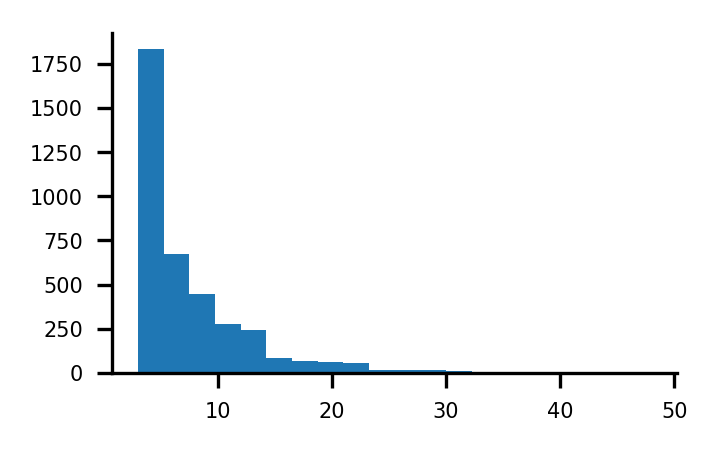

In [27]:
pl.hist(zs_durations_post_Rew_raw,bins=20)
pl.show()

In [28]:
#extract the event max values
for sess in sessions:
    for tt in ('CSm','Rew'):
        exec("zs_maxval_%s_%s_raw = []"%(sess,tt))
        for cell in range(len(eval("zs_extracted_%s_%s_raw"%(sess,tt)))):
            for event in range(len(eval("zs_extracted_%s_%s_raw[cell]"%(sess,tt)))/2):
                try:
                    exec("zs_maxval_%s_%s_raw.append(np.max(zs_extracted_%s_%s_raw[cell]['event_%s']))"%(sess,tt,sess,tt,event))
                except:
                    print 'failed on %s %s, cell: %s, event: %s'%(sess,tt,cell,event)

failed on expo CSm, cell: 358, event: 3
failed on expo CSm, cell: 358, event: 7
failed on expo Rew, cell: 358, event: 0
failed on expo Rew, cell: 358, event: 2
failed on expo Rew, cell: 358, event: 6
failed on pre CSm, cell: 505, event: 1
failed on d2 CSm, cell: 441, event: 0
failed on ext2 CSm, cell: 159, event: 0
failed on renew CSm, cell: 124, event: 0


In [29]:
for sess in sessions:
    for tt in ('CSm','Rew'):
        print sess,tt,'mean:',
        print np.mean(eval("zs_maxval_%s_%s_raw"%(sess,tt))), '    StDev:',
        print np.std(eval("zs_maxval_%s_%s_raw"%(sess,tt)))

expo CSm mean: 5.40177491403     StDev: 1.69919694969
expo Rew mean: 5.39440067815     StDev: 1.78762904559
pre CSm mean: 6.06602708187     StDev: 2.39069333565
pre Rew mean: 6.0244038269     StDev: 2.47082851383
d2 CSm mean: 6.0279297305     StDev: 2.30105912201
d2 Rew mean: 5.93309384695     StDev: 2.2745111505
post CSm mean: 6.17746662298     StDev: 2.45505602115
post Rew mean: 5.95026643184     StDev: 2.3460515319
ext1 CSm mean: 6.12034505804     StDev: 2.2871456522
ext1 Rew mean: 6.0207272444     StDev: 2.24850181039
ext2 CSm mean: 6.0368510011     StDev: 2.23175895225
ext2 Rew mean: 5.97690292642     StDev: 2.26884438055
renew CSm mean: 6.07488623753     StDev: 2.33744549014
renew Rew mean: 6.01915176705     StDev: 2.30656316333


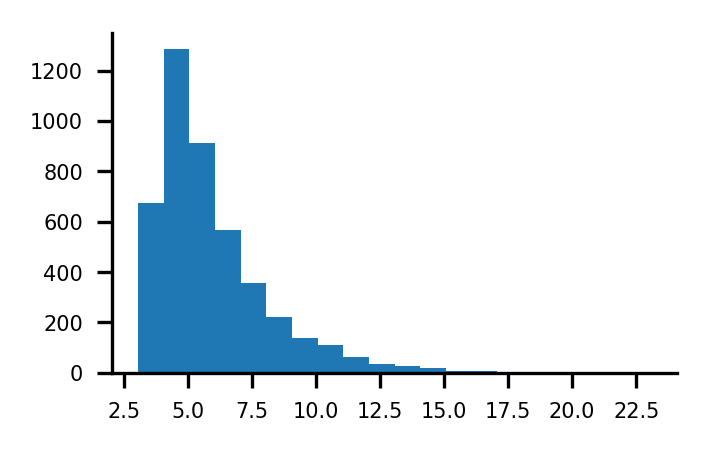

In [30]:
pl.hist(zs_maxval_d2_Rew_raw,bins=20)
pl.show()

## an alternative method for durations (where split up by time period)


In [31]:
%%time
##this takes a while
# make list of all events across all animals, cells, trials, time bins by session AND BY EPOCH.
SD_thresh = 1.5
dur_thresh = 3
for epoch,s,e in zip(['baseline','trial'],[-5.0,1.0],[0.0,7.0]):
    for tt in ['CSm','Rew']:
        for sess in sessions:
            cells=-1 #initialize total cell count for each new session
            print 'working on %s %s %s      '%(epoch,sess,tt),
            exec("dur_%s_%s_%s_raw={}"%(epoch,sess,tt))
            for cell in range(len(eval("zs_all_data_by_cell_%s_%s_raw"%(sess,tt)))):
                exec("dur_%s_%s_%s_raw[cell] = {}"%(epoch,sess,tt)) #initialize for all cells
            for ani in range(len(eval("all_dur_%s_%s_raw"%(sess,tt)))):
                for cell in range(len(eval("all_dur_%s_%s_raw[ani]"%(sess,tt)))):
                    cells=cells+1
                    events=-1 # initialize the events counter for each new neuron (start at -1 so the first entry will actually be 0)
                    duration_counter=0
                    for trial in range(len(eval("all_dur_%s_%s_raw[ani][cell]"%(sess,tt)))):
                        for tb,i in zip(eval("all_dur_%s_%s_raw[ani][cell][trial]"%(sess,tt)),range(len(eval("all_dur_%s_%s_raw[ani][cell][trial]"%(sess,tt))))):
                            if eval("%s_anivars[%s_animals[ani]]['vars_%s']['time_ax_single'][i]"%(sess,sess,sess)) >= s:
                                #below will allow an event's duration to continue being counted if it extends beyond the end time
                                if eval("%s_anivars[%s_animals[ani]]['vars_%s']['time_ax_single'][i]"%(sess,sess,sess)) <= e or duration_counter>1:
                                    #up to here is classifying a time bin as baseline or trial. Next apply duration criteria and extract if met
                                    if tb >= SD_thresh:
                                        duration_counter = duration_counter + 1 #increment the duration counter
                                        if duration_counter == dur_thresh: #when an event crosses threshold
                                            events = events+1
                                            exec("dur_%s_%s_%s_raw[cells]['event_%s'] = []"%(epoch,sess,tt,events)) #create a new dict entry for event values
                                            exec("dur_%s_%s_%s_raw[cells]['tb_%s'] = []"%(epoch,sess,tt,events)) #create a new dict entry for time bins that correspond to event values
                                            for x in range(dur_thresh): #go back and populate list with values that are part of event, but prior to crossing dur_thresh
                                                eval("dur_%s_%s_%s_raw[cells]['event_%s']"%(epoch,sess,tt,events)).insert(x,
                                                      eval("all_dur_%s_%s_raw[ani][cell][trial][i-dur_thresh+x+1]"%(sess,tt)))
                                                eval("dur_%s_%s_%s_raw[cells]['tb_%s']"%(epoch,sess,tt,events)).insert(x,i-dur_thresh+x+1)
                                        if duration_counter > dur_thresh: #continue to populate the list for as long as values > SD thresh
                                            eval("dur_%s_%s_%s_raw[cells]['event_%s']"%(epoch,sess,tt,events)).insert(duration_counter,tb)
                                            eval("dur_%s_%s_%s_raw[cells]['tb_%s']"%(epoch,sess,tt,events)).insert(duration_counter,i)
                                        if duration_counter > 50: #if duration is super long (>6s), it's highly likely due to drifting baseline. DELETE IT
                                            exec("del dur_%s_%s_%s_raw[cells]['event_%s'][:]"%(epoch,sess,tt,events)) # delete the entry
                                            exec("del dur_%s_%s_%s_raw[cells]['tb_%s'][:]"%(epoch,sess,tt,events)) # delete the entry
                                            #events = events -1 # decrement the event counter so we can overwrite this BS (and now empty) list
                                            #duration_counter = 0 # reset the duration counter
                                    if tb < SD_thresh:
                                        duration_counter = 0 # reset the duration counter
                                else:
                                    duration_counter = 0
                            else:
                                duration_counter = 0

working on baseline expo CSm       working on baseline pre CSm       working on baseline d2 CSm       working on baseline post CSm       working on baseline ext1 CSm       working on baseline ext2 CSm       working on baseline renew CSm       working on baseline expo Rew       working on baseline pre Rew       working on baseline d2 Rew       working on baseline post Rew       working on baseline ext1 Rew       working on baseline ext2 Rew       working on baseline renew Rew       working on trial expo CSm       working on trial pre CSm       working on trial d2 CSm       working on trial post CSm       working on trial ext1 CSm       working on trial ext2 CSm       working on trial renew CSm       working on trial expo Rew       working on trial pre Rew       working on trial d2 Rew       working on trial post Rew       working on trial ext1 Rew       working on trial ext2 Rew       working on trial renew Rew      


In [32]:
#extract the event durations
for sess in sessions:
    for tt in ('CSm','Rew'):
        for epoch in 'baseline','trial':
            exec("zs_durations_%s_%s_%s_rawB = []"%(epoch,sess,tt))
            for cell in range(len(eval("dur_%s_%s_%s_raw"%(epoch,sess,tt)))):
                for event in range(len(eval("dur_%s_%s_%s_raw[cell]"%(epoch,sess,tt)))/2):
                    exec("zs_durations_%s_%s_%s_rawB.append(len(dur_%s_%s_%s_raw[cell]['event_%s']))"%(epoch,sess,tt,epoch,sess,tt,event))

In [33]:
for sess in sessions:
    for tt in ('CSm','Rew'):
        for epoch in 'baseline','trial':
            print sess,tt,epoch,'mean:',
            print np.mean(eval("zs_durations_%s_%s_%s_rawB"%(epoch,sess,tt))), '    StDev:',
            print np.std(eval("zs_durations_%s_%s_%s_rawB"%(epoch,sess,tt)))

expo CSm baseline mean: 10.4015331747     StDev: 11.6964546018
expo CSm trial mean: 9.92277657267     StDev: 9.23487810616
expo Rew baseline mean: 10.5613256785     StDev: 11.9050215329
expo Rew trial mean: 10.0358862144     StDev: 9.20053887991
pre CSm baseline mean: 11.6207410351     StDev: 12.0308780787
pre CSm trial mean: 9.67635990421     StDev: 7.5236049218
pre Rew baseline mean: 11.808328292     StDev: 12.074500838
pre Rew trial mean: 9.3599690881     StDev: 7.17647530723
d2 CSm baseline mean: 11.2576875769     StDev: 11.4866902203
d2 CSm trial mean: 9.29417888436     StDev: 7.30034230563
d2 Rew baseline mean: 11.0962492558     StDev: 11.1058548402
d2 Rew trial mean: 8.91773983505     StDev: 6.91328281281
post CSm baseline mean: 11.6428228517     StDev: 12.0443204624
post CSm trial mean: 9.67639340821     StDev: 7.61542385388
post Rew baseline mean: 12.1223004415     StDev: 11.9857312955
post Rew trial mean: 9.43436045579     StDev: 7.08153336625
ext1 CSm baseline mean: 11.66540

In [8]:
time_ax

array([  0.00000000e+00,   2.66631496e-01,   5.33262992e-01, ...,
         2.72633328e+03,   2.72660001e+03,   2.72686673e+03])

In [9]:
time_ax_single

array([-5.        , -4.73327526, -4.46655053, -4.19982579, -3.93310106,
       -3.66637632, -3.39965158, -3.13292685, -2.86620211, -2.59947738,
       -2.33275264, -2.0660279 , -1.79930317, -1.53257843, -1.2658537 ,
       -0.99912896, -0.73240422, -0.46567949, -0.19895475,  0.06776998,
        0.33449472,  0.60121946,  0.86794419,  1.13466893,  1.40139366,
        1.6681184 ,  1.93484314,  2.20156787,  2.46829261,  2.73501734,
        3.00174208,  3.26846682,  3.53519155,  3.80191629,  4.06864102,
        4.33536576,  4.6020905 ,  4.86881523,  5.13553997,  5.4022647 ,
        5.66898944,  5.93571418,  6.20243891,  6.46916365,  6.73588838,
        7.00261312,  7.26933786,  7.53606259,  7.80278733])

In [11]:
hm_pre_CSm_evs[0]

array([ 0.13018891,  0.17399784,  0.16897656,  0.13018891,         nan,
               nan,  0.13018891,  0.1628716 ,  0.17294266,  0.14333059,
        0.15211646,  0.13018891,  0.1674922 ,  0.14757805,  0.13018891,
               nan,  0.13018891,  0.18480961,  0.21241574,  0.22574838,
        0.15056616,         nan,  0.13018891,  0.21219371,  0.22873949,
        0.14313903,  0.23691487,  0.2559445 ,  0.23588094,  0.22464991,
        0.17146043,  0.13957047,  0.14872393,         nan,         nan,
        0.13018891,         nan,  0.13018891,         nan,         nan,
        0.13018891,  0.15677092,  0.18250549,  0.18725654,  0.1900022 ,
        0.18557005,  0.16400906,  0.13018891])

### get data for heatmaps

In [34]:
zscored = True

for sess in sessions:
    exec("all_hms_%s_CSm_evs=[]"%sess)
    exec("all_hms_%s_Rew_evs=[]"%sess)
    for animal in eval("%s_animals"%sess):
    #    cellregs = anivars[animal]['cellregs']
        exec("vars_%s = %s_anivars['%s']['vars_%s']"%(sess,sess,animal,sess))
    
        for k in eval("vars_%s.keys()"%sess):
            exec('%s = vars_%s[\'%s\']' % (k,sess,k))
    
        exec("hm_%s_CSm_evs = np.r_[[ut.compute_all_dffs(time_ax, events, cell, cycles[is_CSmt], time_ax_single)\
                        for cell in range(len(vars_%s['events'][0]))]]"%(sess,sess))
        exec("hm_%s_CSm_evs = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_CSm_evs]]"%(sess,sess))
        exec("hm_%s_Rew_evs = np.r_[[ut.compute_all_dffs(time_ax, events, cell, cycles[is_rewardt], time_ax_single)\
                        for cell in range(len(vars_%s['events'][0]))]]"%(sess,sess))
        exec("hm_%s_Rew_evs = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_Rew_evs]]"%(sess,sess))
        
        eval("all_hms_%s_CSm_evs.append(hm_%s_CSm_evs)"%(sess, sess))
        eval("all_hms_%s_Rew_evs.append(hm_%s_Rew_evs)"%(sess, sess))

/home/fabios/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:1: RuntimeWarning: invalid value encountered in divide
  if __name__ == '__main__':


In [35]:
zscored = True

for sess in sessions:
    exec("all_hms_%s_CSm_traces=[]"%sess)
    exec("all_hms_%s_Rew_traces=[]"%sess)
    for animal in eval("%s_animals"%sess):
    #    cellregs = anivars[animal]['cellregs']
        exec("vars_%s = %s_anivars['%s']['vars_%s']"%(sess,sess,animal,sess))
    
        for k in eval("vars_%s.keys()"%sess):
            exec('%s = vars_%s[\'%s\']' % (k,sess,k))
    
        exec("hm_%s_CSm_traces = np.r_[[ut.compute_all_dffs(time_ax, traces, cell, cycles[is_CSmt], time_ax_single)\
                        for cell in range(len(vars_%s['traces'][0]))]]"%(sess,sess))
        exec("hm_%s_CSm_traces = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_CSm_traces]]"%(sess,sess))
        exec("hm_%s_Rew_traces = np.r_[[ut.compute_all_dffs(time_ax, traces, cell, cycles[is_rewardt], time_ax_single)\
                        for cell in range(len(vars_%s['traces'][0]))]]"%(sess,sess))
        exec("hm_%s_Rew_traces = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_Rew_traces]]"%(sess,sess))
        
        eval("all_hms_%s_CSm_traces.append(hm_%s_CSm_traces)"%(sess, sess))
        eval("all_hms_%s_Rew_traces.append(hm_%s_Rew_traces)"%(sess, sess))

### now 'truncate' the first 11 time bins of each trial (don't need all that data)

In [36]:
def compute_all_dffs_trunc(time_ax, dff, cell, cycles, time_ax_single, cycle_filter=lambda x: True):
    return np.r_[[dff[:, cell][ut.filter_cycle(time_ax, cycles, cycle)][11:len(time_ax_single)]
                              for cycle in range(len(cycles)) if cycle_filter(cycle)]]


In [37]:
zscored = True

for sess in sessions:
    exec("all_hms_%s_CSm_evs_trunc=[]"%sess)
    exec("all_hms_%s_Rew_evs_trunc=[]"%sess)
    for animal in eval("%s_animals"%sess):
    #    cellregs = anivars[animal]['cellregs']
        exec("vars_%s = %s_anivars['%s']['vars_%s']"%(sess,sess,animal,sess))
    
        for k in eval("vars_%s.keys()"%sess):
            exec('%s = vars_%s[\'%s\']' % (k,sess,k))
    
        exec("hm_%s_CSm_evs_trunc = np.r_[[compute_all_dffs_trunc(time_ax, events, cell, cycles[is_CSmt], time_ax_single)\
                        for cell in range(len(vars_%s['events'][0]))]]"%(sess,sess))
        exec("hm_%s_CSm_evs_trunc = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_CSm_evs_trunc]]"%(sess,sess))
        exec("hm_%s_Rew_evs_trunc = np.r_[[compute_all_dffs_trunc(time_ax, events, cell, cycles[is_rewardt], time_ax_single)\
                        for cell in range(len(vars_%s['events'][0]))]]"%(sess,sess))
        exec("hm_%s_Rew_evs_trunc = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_Rew_evs_trunc]]"%(sess,sess))
        
        eval("all_hms_%s_CSm_evs_trunc.append(hm_%s_CSm_evs_trunc)"%(sess, sess))
        eval("all_hms_%s_Rew_evs_trunc.append(hm_%s_Rew_evs_trunc)"%(sess, sess))

/home/fabios/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:1: RuntimeWarning: invalid value encountered in divide
  if __name__ == '__main__':


In [38]:
zscored = True

for sess in sessions:
    exec("all_hms_%s_CSm_traces_trunc=[]"%sess)
    exec("all_hms_%s_Rew_traces_trunc=[]"%sess)
    for animal in eval("%s_animals"%sess):
    #    cellregs = anivars[animal]['cellregs']
        exec("vars_%s = %s_anivars['%s']['vars_%s']"%(sess,sess,animal,sess))
    
        for k in eval("vars_%s.keys()"%sess):
            exec('%s = vars_%s[\'%s\']' % (k,sess,k))
    
        exec("hm_%s_CSm_traces_trunc = np.r_[[compute_all_dffs_trunc(time_ax, traces, cell, cycles[is_CSmt], time_ax_single)\
                        for cell in range(len(vars_%s['traces'][0]))]]"%(sess,sess))
        #exec("hm_%s_CSm_traces_trunc = 
        exec("hm_%s_CSm_traces_trunc = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_CSm_traces_trunc]]"%(sess,sess))
        exec("hm_%s_Rew_traces_trunc = np.r_[[compute_all_dffs_trunc(time_ax, traces, cell, cycles[is_rewardt], time_ax_single)\
                        for cell in range(len(vars_%s['traces'][0]))]]"%(sess,sess))
        exec("hm_%s_Rew_traces_trunc = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_Rew_traces_trunc]]"%(sess,sess))
        
        eval("all_hms_%s_CSm_traces_trunc.append(hm_%s_CSm_traces_trunc)"%(sess, sess))
        eval("all_hms_%s_Rew_traces_trunc.append(hm_%s_Rew_traces_trunc)"%(sess, sess))

In [39]:
len(hm_pre_CSm_traces_trunc[0])

37

In [40]:
for h in hm_pre_CSm_traces_trunc[0,:]:
    print len(h),
    #hm_pre_CSm_traces_trunc_test = np.r_[[h[11:] for h in hm_pre_CSm_traces_trunc]]

TypeError: object of type 'numpy.float64' has no len()

In [ ]:
hm_post_Rew_traces_trunc.shape

### now split trials into 2 arrays, each consisting of alternating trials for each trial type

In [ ]:
# get odd and even instances of each trial type
for sess in sessions:
    for ani in eval("%s_animals"%sess):
        for tt in ('CSmt','rewardt'):
            i=0
            exec("is_%s_even_%s_%s = []"%(tt,sess,ani))
            exec("is_%s_odd_%s_%s = []"%(tt,sess,ani))
            for tr,tb in zip(eval("%s_anivars[ani]['vars_%s']['is_%s']"%(sess,sess,tt)),range(len(eval("%s_anivars[ani]['vars_%s']['is_%s']"%(sess,sess,tt))))):
                if tr == False:
                    exec("is_%s_even_%s_%s.append(False)"%(tt,sess,ani))
                    exec("is_%s_odd_%s_%s.append(False)"%(tt,sess,ani))
                if tr == True:
                    i=i+1
                    if i%2:
                        exec("is_%s_even_%s_%s.append(True)"%(tt,sess,ani))
                        exec("is_%s_odd_%s_%s.append(False)"%(tt,sess,ani))
                    else:
                        exec("is_%s_even_%s_%s.append(False)"%(tt,sess,ani))
                        exec("is_%s_odd_%s_%s.append(True)"%(tt,sess,ani))        

In [ ]:
zscored = True

for sess in sessions:
    exec("all_hms_%s_CSm_evs_even=[]"%sess)
    exec("all_hms_%s_Rew_evs_even=[]"%sess)
    exec("all_hms_%s_CSm_evs_odd=[]"%sess)
    exec("all_hms_%s_Rew_evs_odd=[]"%sess)
    for animal in eval("%s_animals"%sess):
    #    cellregs = anivars[animal]['cellregs']
        exec("vars_%s = %s_anivars['%s']['vars_%s']"%(sess,sess,animal,sess))
    
        for k in eval("vars_%s.keys()"%sess):
            exec('%s = vars_%s[\'%s\']' % (k,sess,k))
        
        for eo in 'even','odd':
            exec("hm_%s_CSm_evs = np.r_[[ut.compute_all_dffs(time_ax, events, cell, cycles[is_CSmt_%s_%s_%s], time_ax_single)\
                            for cell in range(len(vars_%s['events'][0]))]]"%(sess,eo,sess,animal,sess))
            exec("hm_%s_CSm_evs = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_CSm_evs]]"%(sess,sess))
            exec("hm_%s_Rew_evs = np.r_[[ut.compute_all_dffs(time_ax, events, cell, cycles[is_rewardt_%s_%s_%s], time_ax_single)\
                            for cell in range(len(vars_%s['events'][0]))]]"%(sess,eo,sess,animal,sess))
            exec("hm_%s_Rew_evs = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_Rew_evs]]"%(sess,sess))
            
            eval("all_hms_%s_CSm_evs_%s.append(hm_%s_CSm_evs)"%(sess,eo,sess))
            eval("all_hms_%s_Rew_evs_%s.append(hm_%s_Rew_evs)"%(sess,eo,sess))
            #eval("all_hms_%s_CSm_evs_even.append(hm_%s_CSm_evs)"%(sess, sess))
            #eval("all_hms_%s_Rew_evs_even.append(hm_%s_Rew_evs)"%(sess, sess))
            #eval("all_hms_%s_CSm_evs_odd.append(hm_%s_CSm_evs)"%(sess, sess))
            #eval("all_hms_%s_Rew_evs_odd.append(hm_%s_Rew_evs)"%(sess, sess))

In [ ]:
zscored = True

for sess in sessions:
    exec("all_hms_%s_CSm_traces_even=[]"%sess)
    exec("all_hms_%s_Rew_traces_even=[]"%sess)
    exec("all_hms_%s_CSm_traces_odd=[]"%sess)
    exec("all_hms_%s_Rew_traces_odd=[]"%sess)
    for animal in eval("%s_animals"%sess):
    #    cellregs = anivars[animal]['cellregs']
        exec("vars_%s = %s_anivars['%s']['vars_%s']"%(sess,sess,animal,sess))
    
        for k in eval("vars_%s.keys()"%sess):
            exec('%s = vars_%s[\'%s\']' % (k,sess,k))
    
        for eo in 'even','odd':
            exec("hm_%s_CSm_traces = np.r_[[ut.compute_all_dffs(time_ax, traces, cell, cycles[is_CSmt_%s_%s_%s], time_ax_single)\
                            for cell in range(len(vars_%s['traces'][0]))]]"%(sess,eo,sess,animal,sess))
            exec("hm_%s_CSm_traces = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_CSm_traces]]"%(sess,sess))
            exec("hm_%s_Rew_traces = np.r_[[ut.compute_all_dffs(time_ax, traces, cell, cycles[is_rewardt_%s_%s_%s], time_ax_single)\
                            for cell in range(len(vars_%s['traces'][0]))]]"%(sess,eo,sess,animal,sess))
            exec("hm_%s_Rew_traces = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_Rew_traces]]"%(sess,sess))
            
            eval("all_hms_%s_CSm_traces_%s.append(hm_%s_CSm_traces)"%(sess,eo,sess))
            eval("all_hms_%s_Rew_traces_%s.append(hm_%s_Rew_traces)"%(sess,eo,sess))

In [ ]:
print all_hms_post_CSm_traces[0][5]
print all_hms_post_CSm_traces_trunc[0][5]

In [ ]:
for sess in sessions:
    for trialtype in ('CSm','Rew'):
        exec("max_t = np.min([a.shape[1] for a in all_hms_%s_%s_evs])"%(sess,trialtype))
        #max_t_trunc=38 # for eliminating the first ~3s (10 entries) or each trace
        exec("all_hms_%s_%s_evs_trunc = np.row_stack([a[:,:max_t-11] for a in all_hms_%s_%s_evs_trunc])"%(sess,trialtype,sess,trialtype))
        exec("all_hms_%s_%s_traces_trunc = np.row_stack([a[:,:max_t-11] for a in all_hms_%s_%s_traces_trunc])"%(sess,trialtype,sess,trialtype))
        exec("min_time_ax_single_%s_trunc = vars_%s['time_ax_single'][11:max_t]"%(sess,sess))
        exec("all_hms_%s_%s_evs = np.row_stack([a[:, :max_t] for a in all_hms_%s_%s_evs])"%(sess,trialtype,sess,trialtype))
        exec("all_hms_%s_%s_traces = np.row_stack([a[:, :max_t] for a in all_hms_%s_%s_traces])"%(sess,trialtype,sess,trialtype))
        exec("min_time_ax_single_%s = vars_%s['time_ax_single'][:max_t]"%(sess,sess))
        for eo in 'even','odd':
            exec("all_hms_%s_%s_evs_%s = np.row_stack([a[:, :max_t] for a in all_hms_%s_%s_evs_%s])"%(sess,trialtype,eo,sess,trialtype,eo))
            exec("all_hms_%s_%s_traces_%s = np.row_stack([a[:, :max_t] for a in all_hms_%s_%s_traces_%s])"%(sess,trialtype,eo,sess,trialtype,eo))
    print max_t

for sess in sessions:
    for trialtype in ('CSm','Rew'):
        max_t_trunc = 37
        exec("all_hms_%s_%s_evs_trunc = np.row_stack([a[:,-max_t_trunc:] for a in all_hms_%s_%s_evs_trunc])"%(sess,trialtype,sess,trialtype))
        exec("all_hms_%s_%s_traces_trunc = np.row_stack([a[:,-max_t_trunc:] for a in all_hms_%s_%s_traces_trunc])"%(sess,trialtype,sess,trialtype))
        exec("min_time_ax_single_%s_trunc = vars_%s['time_ax_single'][-max_t_trunc:]"%(sess,sess))
    print max_t_trunc

In [ ]:
#convert nan to 0
for sess in sessions:
    for tt in ('CSm','Rew'):
        exec("all_hms_%s_%s_evs[np.isnan(all_hms_%s_%s_evs)]=0"%(sess,tt,sess,tt))
        exec("all_hms_%s_%s_traces[np.isnan(all_hms_%s_%s_traces)]=0"%(sess,tt,sess,tt))
        exec("all_hms_%s_%s_evs_trunc[np.isnan(all_hms_%s_%s_evs_trunc)]=0"%(sess,tt,sess,tt))
        exec("all_hms_%s_%s_traces_trunc[np.isnan(all_hms_%s_%s_traces_trunc)]=0"%(sess,tt,sess,tt))

In [ ]:
#convert nan to 0
for sess in sessions:
    for tt in ('CSm','Rew'):
        for trl in ('even','odd'):
            exec("all_hms_%s_%s_evs_%s[np.isnan(all_hms_%s_%s_evs_%s)]=0"%(sess,tt,trl,sess,tt,trl))
            exec("all_hms_%s_%s_traces_%s[np.isnan(all_hms_%s_%s_traces_%s)]=0"%(sess,tt,trl,sess,tt,trl))

In [ ]:
for sess in sessions:
    for trialtype in ('CSm','Rew'):
        exec("sort_%s_%s_evs = np.argsort([np.argmax(h) for h in all_hms_%s_%s_evs])"%(sess,trialtype,sess,trialtype))
        exec("minsort_%s_%s_evs = np.argsort([np.argmin(h) for h in all_hms_%s_%s_evs])"%(sess,trialtype,sess,trialtype))
        exec("sort_%s_%s_traces = np.argsort([np.argmax(h) for h in all_hms_%s_%s_traces])"%(sess,trialtype,sess,trialtype))
        exec("minsort_%s_%s_traces = np.argsort([np.argmin(h) for h in all_hms_%s_%s_traces])"%(sess,trialtype,sess,trialtype))

In [ ]:
for sess in sessions:
    for trialtype in ('CSm','Rew'):
        exec("sort_%s_%s_evs_trunc = np.argsort([np.argmax(h) for h in all_hms_%s_%s_evs_trunc])"%(sess,trialtype,sess,trialtype))
        exec("minsort_%s_%s_evs_trunc = np.argsort([np.argmin(h) for h in all_hms_%s_%s_evs_trunc])"%(sess,trialtype,sess,trialtype))
        exec("sort_%s_%s_traces_trunc = np.argsort([np.argmax(h) for h in all_hms_%s_%s_traces_trunc])"%(sess,trialtype,sess,trialtype))
        exec("minsort_%s_%s_traces_trunc = np.argsort([np.argmin(h) for h in all_hms_%s_%s_traces_trunc])"%(sess,trialtype,sess,trialtype))

In [ ]:
for sess in sessions:
    for trialtype in ('CSm','Rew'):
        exec("sort_%s_%s_evs_even = np.argsort([np.argmax(h) for h in all_hms_%s_%s_evs_even])"%(sess,trialtype,sess,trialtype))
        exec("sort_%s_%s_traces_even = np.argsort([np.argmax(h) for h in all_hms_%s_%s_traces_even])"%(sess,trialtype,sess,trialtype))
        exec("sort_%s_%s_evs_odd = np.argsort([np.argmax(h) for h in all_hms_%s_%s_evs_odd])"%(sess,trialtype,sess,trialtype))
        exec("sort_%s_%s_traces_odd = np.argsort([np.argmax(h) for h in all_hms_%s_%s_traces_odd])"%(sess,trialtype,sess,trialtype))

In [ ]:
for sess in sessions:
    print sess
    for ani in eval("%s_animals"%sess):
        print ani,":",
        print len(eval("%s_anivars[ani]['vars_%s']['time_ax_single']"%(sess,sess))),
    print len(eval("min_time_ax_single_%s"%sess))
    print len(eval("all_hms_%s_CSm_evs[0]"%sess))
    

In [521]:
print all_hms_renew_Rew_traces[50]
print all_hms_renew_Rew_traces_trunc[50]

[ 0.35410415  0.40722702  0.40722893  0.41005964  0.36816873  0.36816824
  0.36816856  0.36816846  0.39643791  0.32482299  0.32482167  0.32482276
  0.32482354  0.32482183  0.32482281  0.32482502  0.32482443  0.3248221
  0.33911856  0.33912216  0.33912293  0.34841378  0.52875638  0.70415259
  0.70251975  0.74432681  0.71024948  0.66613419  0.68361173  0.70073279
  0.69642622  0.69642429  0.70505449  0.71954354  0.71954501  0.71954241
  0.71954392  0.71954426  0.71954386  0.60486597  0.59213734  0.5636886
  0.56368622  0.56453359  0.57073576  0.58973668  0.58973799  0.58973916]
[ 0.32482276  0.32482354  0.32482183  0.32482281  0.32482502  0.32482443
  0.3248221   0.33911856  0.33912216  0.33912293  0.34841378  0.52875638
  0.70415259  0.70251975  0.74432681  0.71024948  0.66613419  0.68361173
  0.70073279  0.69642622  0.69642429  0.70505449  0.71954354  0.71954501
  0.71954241  0.71954392  0.71954426  0.71954386  0.60486597  0.59213734
  0.5636886   0.56368622  0.56453359  0.57073576  0.

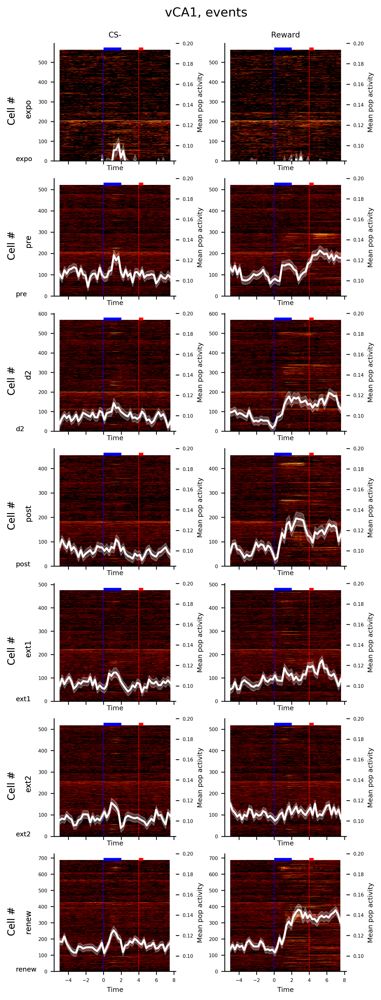

In [26]:
fig, axs = pl.subplots(len(sessions), 2, figsize=(5, np.ceil(all_hms_pre_CSm_evs.shape[0]/40.)), sharex=True)
for sess,i in zip(sessions,range(len(sessions))):
    for tt,z in zip(['CSm','Rew'],range(2)):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s[0]"%sess), eval("min_time_ax_single_%s[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_evs"%(sess,tt)))),vmin=0, vmax=1, cmap='afmhot')

        func(axs[i][z], eval("all_hms_%s_%s_evs"%(sess,tt)))
        axs[i][0].text(-10,0, sess, fontsize=7)
        axs[i][z].set_xlabel("Time")
        axs[i][z].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_evs"%sess)), color=['b','r'], lw=.5)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_evs"%sess))+5, 0, 2, color='b', lw=3)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_evs"%sess))+5, 4, 4.5, color='r', lw=3)
        axs[i][0].text(-9,len(eval("all_hms_%s_CSm_evs"%sess))/2, sess, fontsize=8, rotation=90)
        axs[i][0].text(-11,len(eval("all_hms_%s_CSm_evs"%sess))/2+10, "Cell #", fontsize=10, rotation=90)
        twin_ax = axs[i][z].twinx()
        twin_ax.set_ylabel("Mean pop activity")
        twin_ax.plot(eval("min_time_ax_single_%s"%sess),eval("all_hms_%s_%s_evs.mean(0)"%(sess,tt)),color='w',lw=2)
        m = eval("all_hms_%s_%s_evs.mean(0)"%(sess,tt))
        sem = eval("all_hms_%s_%s_evs.std(0)/(math.sqrt(len(all_hms_%s_%s_evs)))"%(sess,tt,sess,tt))
        twin_ax.fill_between(eval("min_time_ax_single_%s"%sess),m-sem,m+sem,alpha=0.25,color='w',linewidth=1)
        twin_ax.set_ylim(0.085,.2)

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS-', fontsize=8)
axs[0][1].set_title('Reward', fontsize=8)

fig.suptitle("vCA1, events", fontsize=13, y=1.02)
fig.tight_layout()
fig.savefig('../img/%s_event_heatmaps.jpg'%(NOTEBOOK_NAME))

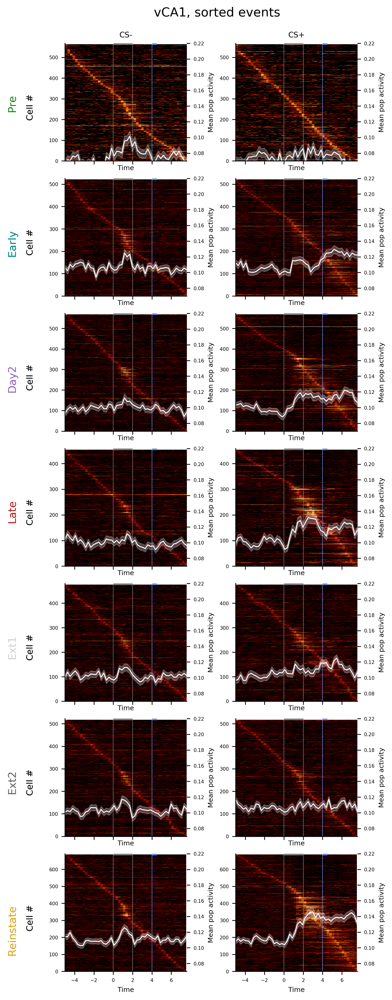

In [10]:
fig, axs = pl.subplots(len(sessions), 2, figsize=(5, np.ceil(all_hms_pre_CSm_evs.shape[0]/40.)), sharex=True)
for sess,i,la,c in zip(sessions,range(len(sessions)),session_labels,dark_co):
    for tt,z in zip(['CSm','Rew'],range(2)):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s[0]"%sess), eval("min_time_ax_single_%s[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_evs"%(sess,tt)))),vmin=0.1, vmax=.7, cmap='afmhot')

        func(axs[i][z], eval("all_hms_%s_%s_evs[sort_%s_%s_evs]"%(sess,tt,sess,tt)))
        #axs[i][0].text(-10,0, sess, fontsize=7)
        axs[i][z].set_xlabel("Time")
        axs[i][z].vlines([0, 2, 4], 0, len(eval("all_hms_%s_CSm_evs"%sess)), color=['grey','grey','cornflowerblue'], lw=.5)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_evs"%sess))+5, 0, 2, color='grey', lw=3)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_evs"%sess))+5, 4, 4.5, color='cornflowerblue', lw=3)
        axs[i][0].text(-11,len(eval("all_hms_%s_CSm_evs"%sess))/2, la, fontsize=11, rotation=90, color=c)
        axs[i][0].text(-9,len(eval("all_hms_%s_CSm_evs"%sess))/2+10, "Cell #", fontsize=9, rotation=90)
        twin_ax = axs[i][z].twinx()
        twin_ax.set_ylabel("Mean pop activity")
        twin_ax.plot(eval("min_time_ax_single_%s"%sess),eval("all_hms_%s_%s_evs.mean(0)"%(sess,tt)),color='w',lw=1)
        m = eval("all_hms_%s_%s_evs.mean(0)"%(sess,tt))
        sem = eval("all_hms_%s_%s_evs.std(0)/(math.sqrt(len(all_hms_%s_%s_evs)))"%(sess,tt,sess,tt))
        twin_ax.fill_between(eval("min_time_ax_single_%s"%sess),m-sem,m+sem,alpha=0.25,color='w',linewidth=1)
        twin_ax.set_ylim(0.07,.22)

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS-', fontsize=8)
axs[0][1].set_title('CS+', fontsize=8)

fig.suptitle("vCA1, sorted events", fontsize=13, y=1.02)
fig.tight_layout()
fig.savefig('../final-ish figures/%s_sorted_event_heatmaps.pdf'%(NOTEBOOK_NAME))

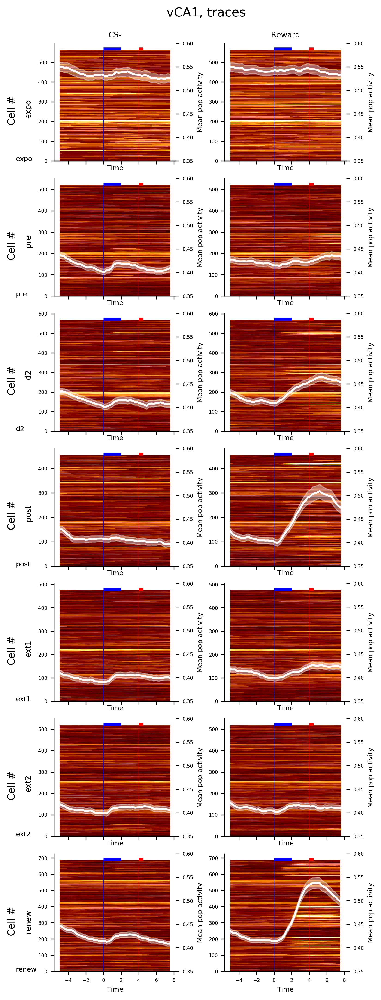

In [48]:
fig, axs = pl.subplots(len(sessions), 2, figsize=(5, np.ceil(all_hms_pre_CSm_traces.shape[0]/40.)), sharex=True)
for sess,i in zip(sessions,range(len(sessions))):
    for tt,z in zip(['CSm','Rew'],range(2)):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s[0]"%sess), eval("min_time_ax_single_%s[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_traces"%(sess,tt)))),vmin=0, vmax=1.5, cmap='afmhot')

        func(axs[i][z], eval("all_hms_%s_%s_traces"%(sess,tt)))
        axs[i][0].text(-10,0, sess, fontsize=7)
        axs[i][z].set_xlabel("Time")
        axs[i][z].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_traces"%sess)), color=['b','r'], lw=.5)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_traces"%sess))+5, 0, 2, color='b', lw=3)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_traces"%sess))+5, 4, 4.5, color='r', lw=3)
        axs[i][0].text(-9,len(eval("all_hms_%s_CSm_traces"%sess))/2, sess, fontsize=8, rotation=90)
        axs[i][0].text(-11,len(eval("all_hms_%s_CSm_traces"%sess))/2+10, "Cell #", fontsize=10, rotation=90)
        twin_ax = axs[i][z].twinx()
        twin_ax.set_ylabel("Mean pop activity")
        twin_ax.plot(eval("min_time_ax_single_%s"%sess),eval("all_hms_%s_%s_traces.mean(0)"%(sess,tt)),color='w',lw=2)
        m = eval("all_hms_%s_%s_traces.mean(0)"%(sess,tt))
        sem = eval("all_hms_%s_%s_traces.std(0)/(math.sqrt(len(all_hms_%s_%s_traces)))"%(sess,tt,sess,tt))
        twin_ax.fill_between(eval("min_time_ax_single_%s"%sess),m-sem,m+sem,alpha=0.4,color='w',linewidth=1)
        twin_ax.set_ylim(0.35,.6)

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS-', fontsize=8)
axs[0][1].set_title('Reward', fontsize=8)

fig.suptitle("vCA1, traces", fontsize=13, y=1.02)
fig.tight_layout()
fig.savefig('../img/%s_traces_heatmaps.jpg'%(NOTEBOOK_NAME))

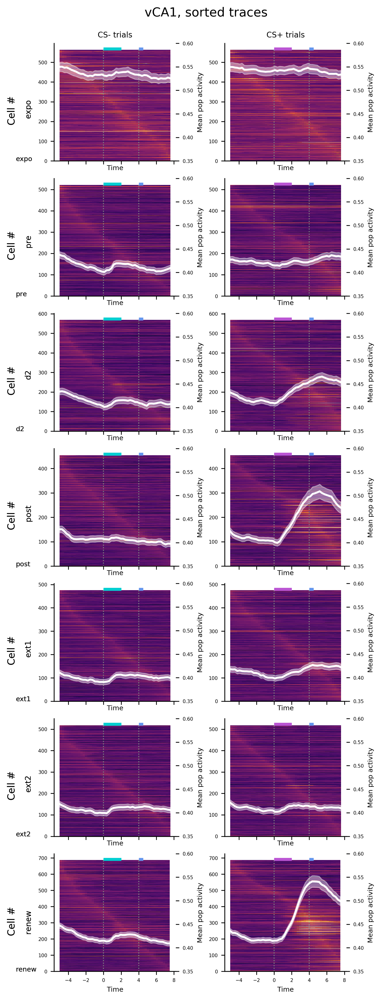

In [24]:
fig, axs = pl.subplots(len(sessions), 2, figsize=(5, np.ceil(all_hms_pre_CSm_traces.shape[0]/40.)), sharex=True)
for sess,i in zip(sessions,range(len(sessions))):
    for tt,z in zip(['CSm','Rew'],range(2)):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s[0]"%sess), eval("min_time_ax_single_%s[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_traces"%(sess,tt)))),vmin=0, vmax=1.5, cmap='inferno')

        im=func(axs[i][z], eval("all_hms_%s_%s_traces[sort_%s_%s_traces]"%(sess,tt,sess,tt)))
        axs[i][0].text(-10,0, sess, fontsize=7)
        axs[i][z].set_xlabel("Time")
        axs[i][0].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_traces"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
        axs[i][0].hlines(len(eval("all_hms_%s_CSm_evs"%sess))+5, 0, 2, color='darkturquoise', lw=3)
        axs[i][1].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_traces"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
        axs[i][1].hlines(len(eval("all_hms_%s_CSm_evs"%sess))+5, 0, 2, color='mediumorchid', lw=3)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_evs"%sess))+5, 4, 4.5, color='cornflowerblue', lw=3)
        axs[i][0].text(-9,len(eval("all_hms_%s_CSm_traces"%sess))/2, sess, fontsize=8, rotation=90)
        axs[i][0].text(-11,len(eval("all_hms_%s_CSm_traces"%sess))/2+10, "Cell #", fontsize=10, rotation=90)
        twin_ax = axs[i][z].twinx()
        twin_ax.set_ylabel("Mean pop activity")
        twin_ax.plot(eval("min_time_ax_single_%s"%sess),eval("all_hms_%s_%s_traces.mean(0)"%(sess,tt)),color='w',lw=2)
        m = eval("all_hms_%s_%s_traces.mean(0)"%(sess,tt))
        sem = eval("all_hms_%s_%s_traces.std(0)/(math.sqrt(len(all_hms_%s_%s_traces)))"%(sess,tt,sess,tt))
        twin_ax.fill_between(eval("min_time_ax_single_%s"%sess),m-sem,m+sem,alpha=0.4,color='w',linewidth=1)
        twin_ax.set_ylim(0.35,.6)
        #cax = fig.add_axes([1,0.3, 0.01, 0.4])
        #fig.colorbar(im, cax=cax, label='Decoding perf. (%)')

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS- trials', fontsize=8)
axs[0][1].set_title('CS+ trials', fontsize=8)


fig.suptitle("vCA1, sorted traces", fontsize=13, y=1.02)
fig.tight_layout()
fig.savefig('../final-ish figures/%s_sorted_traces_heatmaps.pdf'%(NOTEBOOK_NAME))

In [25]:
min_time_ax_single_post_trunc

array([-2.05218304, -1.78419968, -1.51621632, -1.24823296, -0.9802496 ,
       -0.71226624, -0.44428288, -0.17629952,  0.09168384,  0.3596672 ,
        0.62765056,  0.89563392,  1.16361728,  1.43160064,  1.699584  ,
        1.96756736,  2.23555072,  2.50353408,  2.77151744,  3.0395008 ,
        3.30748416,  3.57546752,  3.84345088,  4.11143424,  4.3794176 ,
        4.64740096,  4.91538432,  5.18336768,  5.45135104,  5.7193344 ,
        5.98731776,  6.25530112,  6.52328448,  6.79126784,  7.0592512 ,
        7.32723456,  7.59521792])

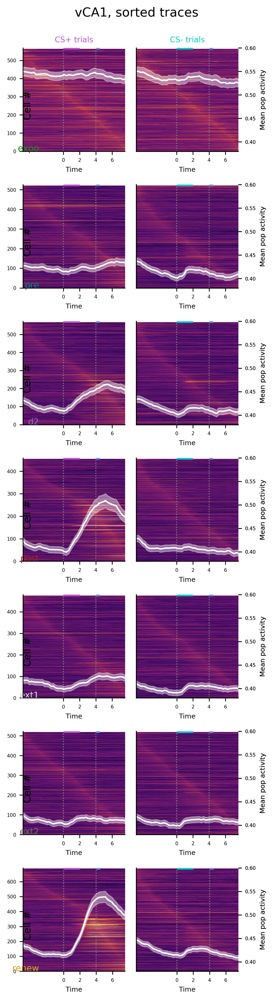

In [8]:
pl.rcParams['axes.xmargin'] = 0
pl.rcParams['axes.ymargin'] = 0
fig, axs = pl.subplots(len(sessions), 2, figsize=(4, np.ceil(all_hms_pre_CSm_traces.shape[0]/40.)))
for sess,i in zip(sessions,range(len(sessions))):
    for tt,z in zip(['Rew','CSm'],range(2)):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s[0]"%sess), eval("min_time_ax_single_%s[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_traces"%(sess,tt)))),vmin=0, vmax=1.5, cmap='inferno')

        im=func(axs[i][z], eval("all_hms_%s_%s_traces[sort_%s_%s_traces]"%(sess,tt,sess,tt)))
        axs[i][0].text(-3,0, sess, fontsize=9,color = dark_co[i],ha='right')
        axs[i][z].set_xlabel("Time")
        axs[i][z].set_xlim(-1.7,7.5)
        axs[i][z].set_xticks([0,2,4,6])
        #axs[i][z].set_xlim(-2,8)
        axs[i][0].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_traces"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
        axs[i][0].hlines(len(eval("all_hms_%s_CSm_evs"%sess))+5, 0, 2, color='mediumorchid', lw=3)
        axs[i][1].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_traces"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
        axs[i][1].hlines(len(eval("all_hms_%s_CSm_evs"%sess))+5, 0, 2, color='darkturquoise', lw=3)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_evs"%sess))+5, 4, 4.5, color='cornflowerblue', lw=3)
        axs[i][0].text(-5,len(eval("all_hms_%s_CSm_traces"%sess))/2+10, "Cell #", fontsize=10, rotation=90)
        axs[i][1].tick_params(labelleft=False)
        twin_ax = axs[i][z].twinx()
        twin_ax.plot(eval("min_time_ax_single_%s"%sess),eval("all_hms_%s_%s_traces.mean(0)"%(sess,tt)),color='w',lw=1.5)
        m = eval("all_hms_%s_%s_traces.mean(0)"%(sess,tt))
        sem = eval("all_hms_%s_%s_traces.std(0)/(math.sqrt(len(all_hms_%s_%s_traces)))"%(sess,tt,sess,tt))
        twin_ax.fill_between(eval("min_time_ax_single_%s"%sess),m-sem,m+sem,alpha=0.4,color='w',linewidth=1)
        ylim_A=.38
        ylim_B=.6
        twin_ax.set_ylim(ylim_A,ylim_B)
        twin_ax.set_yticks([.4,.45,.5,.55,.6])
        twin_ax2 = axs[i][1].twinx()
        twin_ax2.set_ylim(ylim_A,ylim_B)
        twin_ax2.set_yticks([.4,.45,.5,.55,.6])
        twin_ax.tick_params(right=False,labelright=False)
        twin_ax2.set_ylabel("Mean pop activity")
        #pl.margins(x=0,y=.01) #to eliminate white space tween axes and data
        #cax = fig.add_axes([1,0.3, 0.01, 0.4])
        #fig.colorbar(im, cax=cax, label='z-score')
for i in range(len(sessions)):
    axs[i][1].tick_params(left=False,labelleft=False)


# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS+ trials', fontsize=8,color='mediumorchid')
axs[0][1].set_title('CS- trials', fontsize=8,color='darkturquoise')

fig.suptitle("vCA1, sorted traces", fontsize=13, y=1.02)
fig.tight_layout(pad=2)
fig.savefig('../final-ish figures/%s_sorted_traces_heatmaps.pdf'%(NOTEBOOK_NAME))

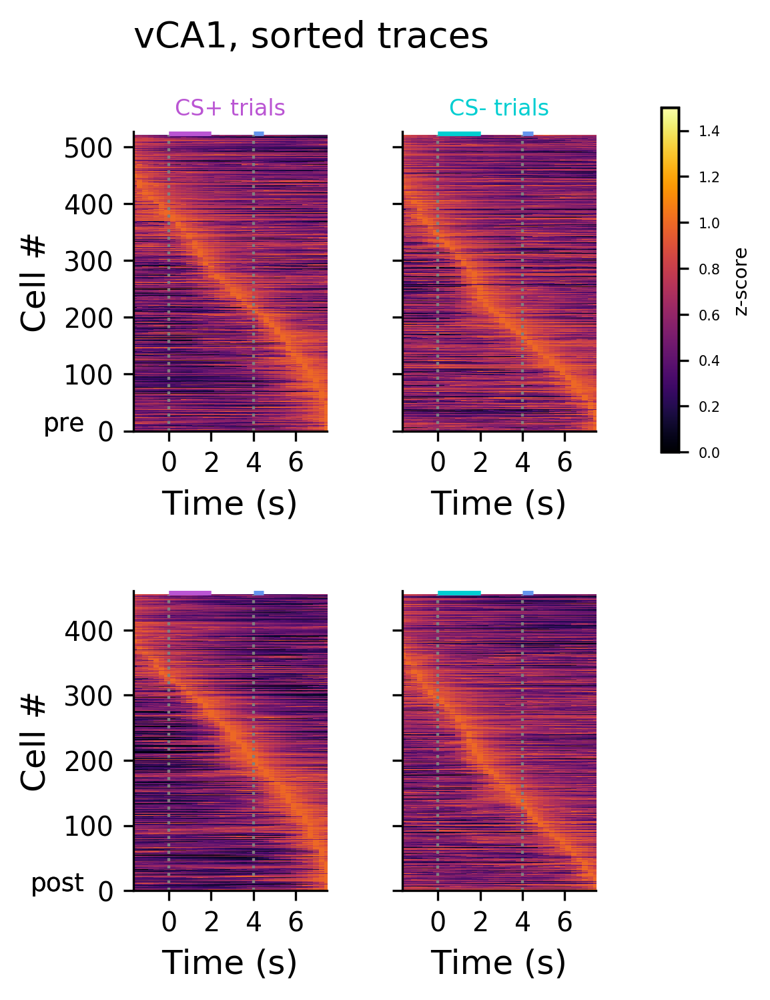

In [221]:
pl.rcParams['axes.xmargin'] = 0
pl.rcParams['axes.ymargin'] = 0
fig, axs = pl.subplots(2, 2, figsize=(3.5, np.ceil(all_hms_pre_CSm_traces.shape[0]/120.)))
for sess,i in zip(['pre','post'],range(2)):
    for tt,z in zip(['Rew','CSm'],range(2)):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s_trunc[0]"%sess), eval("min_time_ax_single_%s_trunc[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_traces_trunc"%(sess,tt)))),vmin=0, vmax=1.5, cmap='inferno')

        im=func(axs[i][z], eval("all_hms_%s_%s_traces_trunc[sort_%s_%s_traces_trunc]"%(sess,tt,sess,tt)))
        axs[i][0].text(-4,0, sess, fontsize=9,color = 'k',ha='right')
        axs[i][z].set_xlabel("Time (s)",fontsize=12)
        axs[i][z].set_xlim(-1.7,7.5)
        axs[i][0].set_ylabel("Cell #",fontsize=12)
        for label in (axs[i][z].get_xticklabels() + axs[i][z].get_yticklabels()):
            label.set_fontsize(9.5)
        axs[i][z].set_xticks([0,2,4,6])
        #axs[i][z].set_xlim(-2,8)
        axs[i][0].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_traces_trunc"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
        axs[i][0].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 0, 2, color='mediumorchid', lw=3)
        axs[i][1].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_traces_trunc"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
        axs[i][1].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 0, 2, color='darkturquoise', lw=3)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 4, 4.5, color='cornflowerblue', lw=3)
        axs[i][1].tick_params(labelleft=False)
        cax = fig.add_axes([1,0.588, 0.025, 0.344])
        fig.colorbar(im, cax=cax, label='z-score')
for i in range(2):
    axs[i][1].tick_params(labelleft=False)


# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS+ trials', fontsize=8,color='mediumorchid')
axs[0][1].set_title('CS- trials', fontsize=8,color='darkturquoise')

fig.suptitle("vCA1, sorted traces", fontsize=13, y=1.02)
fig.tight_layout(pad=2)
fig.savefig('../final-ish figures/%s_sorted_traces_heatmaps_trunc_no_mean.pdf'%(NOTEBOOK_NAME))

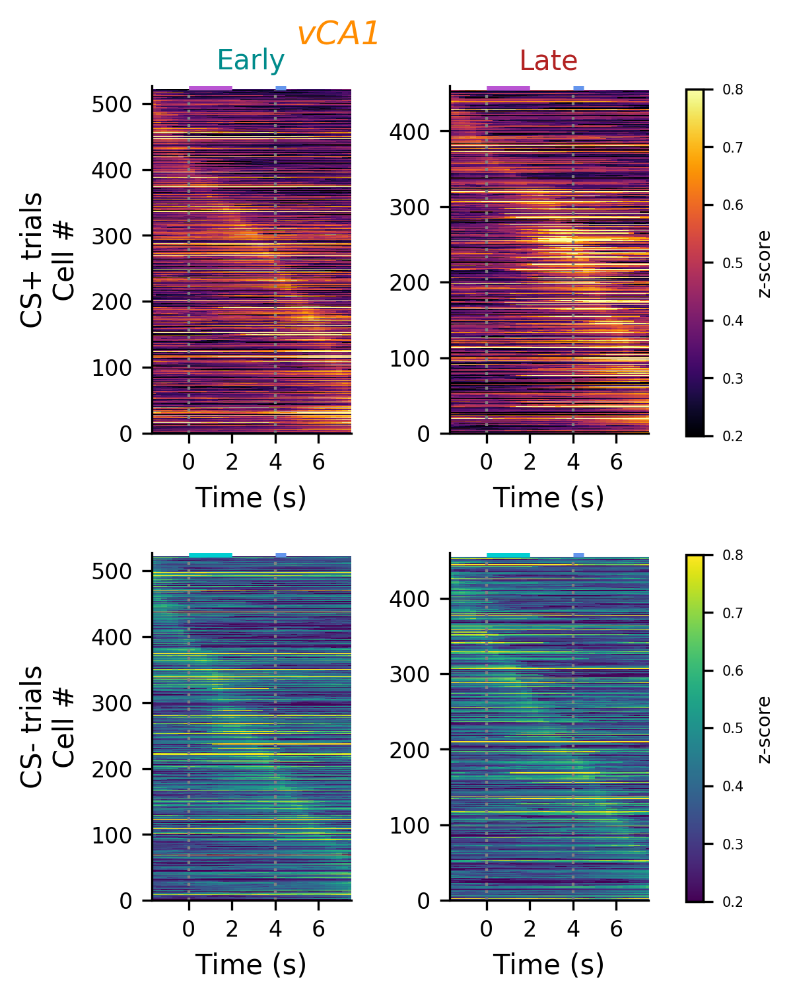

In [550]:
pl.rcParams['axes.xmargin'] = 0
pl.rcParams['axes.ymargin'] = 0
fig, axs = pl.subplots(2, 2, figsize=(3.5, np.ceil(all_hms_pre_CSm_traces.shape[0]/120.)))
for sess,i in zip(['pre','post'],range(2)):
    for tt,z in zip(['Rew','CSm'],range(2)):
        funcCSp = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s_trunc[0]"%sess), eval("min_time_ax_single_%s_trunc[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_traces_trunc"%(sess,tt)))),vmin=.2, vmax=.8, cmap='inferno')
        funcCSm = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s_trunc[0]"%sess), eval("min_time_ax_single_%s_trunc[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_traces_trunc"%(sess,tt)))),vmin=.2, vmax=.8, cmap='viridis')
        if tt == 'Rew':
            im=funcCSp(axs[z][i], eval("all_hms_%s_%s_traces_trunc[sort_%s_%s_traces_trunc]"%(sess,tt,sess,tt)))
        if tt == 'CSm':
            im=funcCSm(axs[z][i], eval("all_hms_%s_%s_traces_trunc[sort_%s_%s_traces_trunc]"%(sess,tt,sess,tt)))
        axs[z][i].set_xlabel("Time (s)",fontsize=10)
        axs[z][i].set_xlim(-1.7,7.5)
        axs[z][i].set_xticks([0,2,4,6])
        axs[0][0].set_ylabel("CS+ trials\nCell #",fontsize=10)
        axs[1][0].set_ylabel("CS- trials\nCell #",fontsize=10)
        for label in (axs[z][i].get_xticklabels() + axs[z][i].get_yticklabels()):
            label.set_fontsize(8)
        axs[0][i].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_traces_trunc"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
        axs[0][i].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 0, 2, color='mediumorchid', lw=3)
        axs[1][i].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_traces_trunc"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
        axs[1][i].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 0, 2, color='darkturquoise', lw=3)
        axs[z][i].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 4, 4.5, color='cornflowerblue', lw=3)
        #axs[z][1].tick_params(labelleft=False)
        if tt == 'CSm':
            caxA = fig.add_axes([1,0.11, 0.025, 0.35])
            fig.colorbar(im, cax=caxA, label='z-score')
        if tt == 'Rew':
            cax = fig.add_axes([1,0.58, 0.025, 0.35])
            fig.colorbar(im, cax=cax, label='z-score')
#for i in range(2):
#    axs[z][1].tick_params(labelleft=False)


# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('Early', fontsize=10,color=dark_co[1])
axs[0][1].set_title('Late', fontsize=10,color=dark_co[3])

fig.suptitle("vCA1", fontsize=12, y=1.,color='darkorange',fontstyle='italic')
fig.tight_layout(pad=1)
fig.savefig('../final-ish figures/%s_sorted_traces_heatmaps_trunc_no_mean_alt.pdf'%(NOTEBOOK_NAME))

In [ ]:
all_hms_pre_CSm_

In [ ]:
pl.rcParams['axes.xmargin'] = 0
pl.rcParams['axes.ymargin'] = 0
fig, axs = pl.subplots(2, 2, figsize=(3.5, np.ceil(all_hms_pre_CSm_evs.shape[0]/120.)))
for sess,i in zip(['pre','post'],range(2)):
    for tt,z in zip(['Rew','CSm'],range(2)):
        funcCSp = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s_trunc[0]"%sess), eval("min_time_ax_single_%s_trunc[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_evs_trunc"%(sess,tt)))),vmin=.2, vmax=.8, cmap='inferno')
        funcCSm = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s_trunc[0]"%sess), eval("min_time_ax_single_%s_trunc[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_evs_trunc"%(sess,tt)))),vmin=.2, vmax=.8, cmap='viridis')
        if tt == 'Rew':
            im=funcCSp(axs[z][i], eval("all_hms_%s_%s_evs_trunc[sort_%s_%s_evs_trunc]"%(sess,tt,sess,tt)))
        if tt == 'CSm':
            im=funcCSm(axs[z][i], eval("all_hms_%s_%s_evs_trunc[sort_%s_%s_evs_trunc]"%(sess,tt,sess,tt)))
        axs[z][i].set_xlabel("Time (s)",fontsize=10)
        axs[z][i].set_xlim(-1.7,7.5)
        axs[z][i].set_xticks([0,2,4,6])
        axs[0][0].set_ylabel("CS+ trials\nCell #",fontsize=10)
        axs[1][0].set_ylabel("CS- trials\nCell #",fontsize=10)
        for label in (axs[z][i].get_xticklabels() + axs[z][i].get_yticklabels()):
            label.set_fontsize(8)
        axs[0][i].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_evs_trunc"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
        axs[0][i].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 0, 2, color='mediumorchid', lw=3)
        axs[1][i].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_evs_trunc"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
        axs[1][i].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 0, 2, color='darkturquoise', lw=3)
        axs[z][i].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 4, 4.5, color='cornflowerblue', lw=3)
        #axs[z][1].tick_params(labelleft=False)
        if tt == 'CSm':
            caxA = fig.add_axes([1,0.11, 0.025, 0.35])
            fig.colorbar(im, cax=caxA, label='z-score')
        if tt == 'Rew':
            cax = fig.add_axes([1,0.58, 0.025, 0.35])
            fig.colorbar(im, cax=cax, label='z-score')
#for i in range(2):
#    axs[z][1].tick_params(labelleft=False)


# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('Early', fontsize=10,color=dark_co[1])
axs[0][1].set_title('Late', fontsize=10,color=dark_co[3])

fig.suptitle("vCA1", fontsize=12, y=1.,color='darkorange',fontstyle='italic')
fig.tight_layout(pad=1)
fig.savefig('../final-ish figures/%s_sorted_evs_heatmaps_trunc_no_mean_alt.pdf'%(NOTEBOOK_NAME))

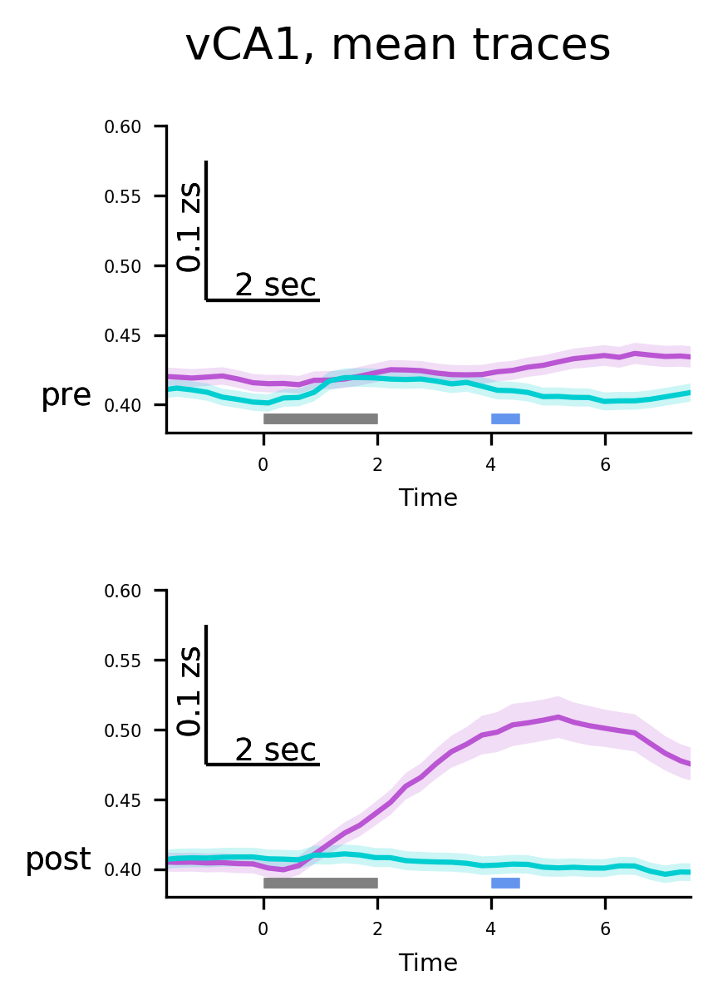

In [551]:
pl.rcParams['axes.xmargin'] = 0
pl.rcParams['axes.ymargin'] = 0
fig, axs = pl.subplots(2, 1, figsize=(3, 4))
for sess,i in zip(['pre','post'],range(2)):
    for tt,z in zip(['Rew','CSm'],['mediumorchid','darkturquoise']):
        axs[i].plot(eval("min_time_ax_single_%s_trunc"%sess),eval("all_hms_%s_%s_traces_trunc.mean(0)"%(sess,tt)),color=z,lw=1.5)
        m = eval("all_hms_%s_%s_traces_trunc.mean(0)"%(sess,tt))
        sem = eval("all_hms_%s_%s_traces_trunc.std(0)/(math.sqrt(len(all_hms_%s_%s_traces_trunc)))"%(sess,tt,sess,tt))
        axs[i].fill_between(eval("min_time_ax_single_%s_trunc"%sess),m-sem,m+sem,alpha=0.2,facecolor=z)
        #func = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s_trunc[0]"%sess), eval("min_time_ax_single_%s_trunc[-1]"%sess), 0, 
        #                         len(eval("all_hms_%s_%s_traces_trunc"%(sess,tt)))),vmin=0, vmax=1.5, cmap='inferno')
#
        #im=func(axs[i], eval("all_hms_%s_%s_traces_trunc[sort_%s_%s_traces_trunc]"%(sess,tt,sess,tt)))
        axs[i].text(-3,0.4, sess, fontsize=9,color = 'k',ha='right')
        axs[i].set_xlabel("Time")
        axs[i].set_xlim(-1.7,7.5)
        axs[i].set_xticks([0,2,4,6])
        axs[i].set_ylim(.38,.6)
        axs[i].vlines(-1, 0.475, .575, color='k', lw=1)
        axs[i].text(-1.5,.495,'0.1 zs',rotation=90,ha='left',va='bottom',fontsize=9)
        axs[i].hlines(.39, 0, 2, color='gray', lw=3)
        axs[i].hlines(0.475, -1, 1, color='k', lw=1)
        axs[i].text(-.5,.495,'2 sec',ha='left',va='top',fontsize=9)
        axs[i].hlines(.39, 4, 4.5, color='cornflowerblue', lw=3)
        #axs[i].text(-5,len(eval("all_hms_%s_CSm_traces_trunc"%sess))/2+10, "Cell #", fontsize=10, rotation=90)
        #axs[i].tick_params(labelleft=False)
        #cax = fig.add_axes([1,0.3, 0.01, 0.4])
        #fig.colorbar(im, cax=cax, label='z-score')
##for i in range(2):
##    axs[i][1].tick_params(left=False,labelleft=False)


# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

#axs[0][0].set_title('CS+ trials', fontsize=8,color='mediumorchid')
#axs[0][1].set_title('CS- trials', fontsize=8,color='darkturquoise')

fig.suptitle("vCA1, mean traces", fontsize=13, y=1.02)
fig.tight_layout(pad=2)
fig.savefig('../final-ish figures/%s_heatmaps_trunc_mean_only.pdf'%(NOTEBOOK_NAME))




#twin_ax.plot(eval("min_time_ax_single_%s_trunc"%sess),eval("all_hms_%s_%s_traces_trunc.mean(0)"%(sess,tt)),color='w',lw=1.5)
#        m = eval("all_hms_%s_%s_traces_trunc.mean(0)"%(sess,tt))
#        sem = eval("all_hms_%s_%s_traces_trunc.std(0)/(math.sqrt(len(all_hms_%s_%s_traces_trunc)))"%(sess,tt,sess,tt))
#        twin_ax.fill_between(eval("min_time_ax_single_%s_trunc"%sess),m-sem,m+sem,alpha=0.4,color='w',linewidth=1)

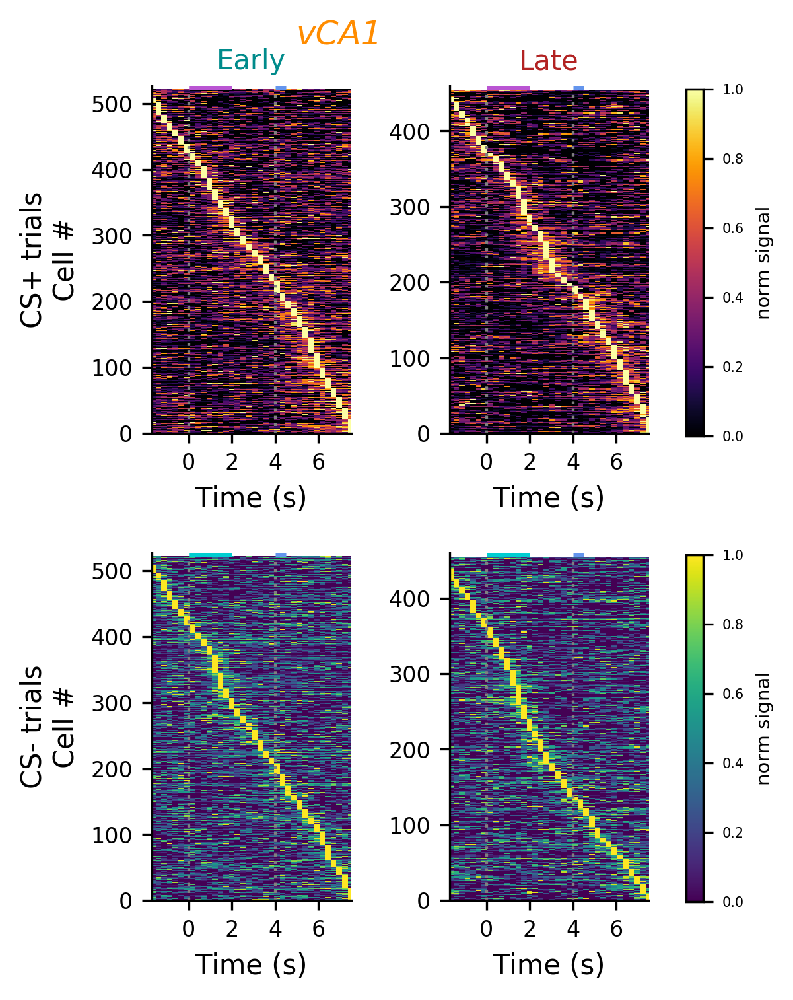

In [489]:
pl.rcParams['axes.xmargin'] = 0
pl.rcParams['axes.ymargin'] = 0
fig, axs = pl.subplots(2, 2, figsize=(3.5, np.ceil(all_hms_pre_CSm_evs.shape[0]/120.)))
for sess,i in zip(['pre','post'],range(2)):
    for tt,z in zip(['Rew','CSm'],range(2)):
        funcCSp = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s_trunc[0]"%sess), eval("min_time_ax_single_%s_trunc[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_evs_trunc"%(sess,tt)))),vmin=0, vmax=1, cmap='inferno')
        funcCSm = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s_trunc[0]"%sess), eval("min_time_ax_single_%s_trunc[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_evs_trunc"%(sess,tt)))),vmin=0, vmax=1, cmap='viridis')
        if tt == 'Rew':
            im=funcCSp(axs[z][i], eval("all_hms_%s_%s_evs_trunc[sort_%s_%s_evs_trunc]"%(sess,tt,sess,tt)))
        if tt == 'CSm':
            im=funcCSm(axs[z][i], eval("all_hms_%s_%s_evs_trunc[sort_%s_%s_evs_trunc]"%(sess,tt,sess,tt)))
        axs[z][i].set_xlabel("Time (s)",fontsize=10)
        axs[z][i].set_xlim(-1.7,7.5)
        axs[z][i].set_xticks([0,2,4,6])
        axs[0][0].set_ylabel("CS+ trials\nCell #",fontsize=10)
        axs[1][0].set_ylabel("CS- trials\nCell #",fontsize=10)
        for label in (axs[z][i].get_xticklabels() + axs[z][i].get_yticklabels()):
            label.set_fontsize(8)
        axs[0][i].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_evs_trunc"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
        axs[0][i].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 0, 2, color='mediumorchid', lw=3)
        axs[1][i].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_evs_trunc"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
        axs[1][i].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 0, 2, color='darkturquoise', lw=3)
        axs[z][i].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 4, 4.5, color='cornflowerblue', lw=3)
        #axs[z][1].tick_params(labelleft=False)
        if tt == 'CSm':
            caxA = fig.add_axes([1,0.11, 0.025, 0.35])
            fig.colorbar(im, cax=caxA, label='norm signal')
        if tt == 'Rew':
            cax = fig.add_axes([1,0.58, 0.025, 0.35])
            fig.colorbar(im, cax=cax, label='norm signal')
#for i in range(2):
#    axs[z][1].tick_params(labelleft=False)


# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('Early', fontsize=10,color=dark_co[1])
axs[0][1].set_title('Late', fontsize=10,color=dark_co[3])

fig.suptitle("vCA1", fontsize=12, y=1.,color='darkorange',fontstyle='italic')
fig.tight_layout(pad=1)
fig.savefig('../final-ish figures/%s_sorted_evs_heatmaps_trunc_no_mean_alt_normalized.pdf'%(NOTEBOOK_NAME))

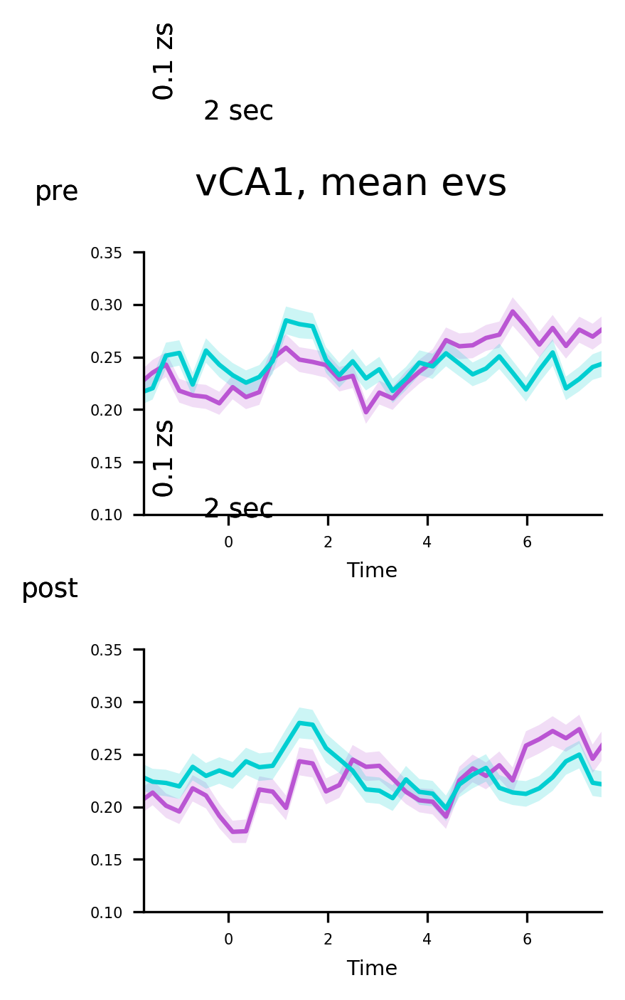

In [495]:
pl.rcParams['axes.xmargin'] = 0
pl.rcParams['axes.ymargin'] = 0
fig, axs = pl.subplots(2, 1, figsize=(3, 4))
for sess,i in zip(['pre','post'],range(2)):
    for tt,z in zip(['Rew','CSm'],['mediumorchid','darkturquoise']):
        axs[i].plot(eval("min_time_ax_single_%s_trunc"%sess),eval("all_hms_%s_%s_evs_trunc.mean(0)"%(sess,tt)),color=z,lw=1.5)
        m = eval("all_hms_%s_%s_evs_trunc.mean(0)"%(sess,tt))
        sem = eval("all_hms_%s_%s_evs_trunc.std(0)/(math.sqrt(len(all_hms_%s_%s_evs_trunc)))"%(sess,tt,sess,tt))
        axs[i].fill_between(eval("min_time_ax_single_%s_trunc"%sess),m-sem,m+sem,alpha=0.2,facecolor=z)
        #func = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s_trunc[0]"%sess), eval("min_time_ax_single_%s_trunc[-1]"%sess), 0, 
        #                         len(eval("all_hms_%s_%s_evs_trunc"%(sess,tt)))),vmin=0, vmax=1.5, cmap='inferno')
#
        #im=func(axs[i], eval("all_hms_%s_%s_evs_trunc[sort_%s_%s_evs_trunc]"%(sess,tt,sess,tt)))
        axs[i].text(-3,0.4, sess, fontsize=9,color = 'k',ha='right')
        axs[i].set_xlabel("Time")
        axs[i].set_xlim(-1.7,7.5)
        axs[i].set_xticks([0,2,4,6])
        axs[i].set_ylim(0.1,.35)
        axs[i].vlines(-1, 0.475, .575, color='k', lw=1)
        axs[i].text(-1.5,.495,'0.1 zs',rotation=90,ha='left',va='bottom',fontsize=9)
        axs[i].hlines(.39, 0, 2, color='gray', lw=3)
        axs[i].hlines(0.475, -1, 1, color='k', lw=1)
        axs[i].text(-.5,.495,'2 sec',ha='left',va='top',fontsize=9)
        axs[i].hlines(.39, 4, 4.5, color='cornflowerblue', lw=3)
        #axs[i].text(-5,len(eval("all_hms_%s_CSm_evs_trunc"%sess))/2+10, "Cell #", fontsize=10, rotation=90)
        #axs[i].tick_params(labelleft=False)
        #cax = fig.add_axes([1,0.3, 0.01, 0.4])
        #fig.colorbar(im, cax=cax, label='z-score')
##for i in range(2):
##    axs[i][1].tick_params(left=False,labelleft=False)


# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

#axs[0][0].set_title('CS+ trials', fontsize=8,color='mediumorchid')
#axs[0][1].set_title('CS- trials', fontsize=8,color='darkturquoise')

fig.suptitle("vCA1, mean evs", fontsize=13, y=1.02)
fig.tight_layout(pad=2)
fig.savefig('../final-ish figures/%s_heatmaps_trunc_mean_only_normalized_evs.pdf'%(NOTEBOOK_NAME))




#twin_ax.plot(eval("min_time_ax_single_%s_trunc"%sess),eval("all_hms_%s_%s_evs_trunc.mean(0)"%(sess,tt)),color='w',lw=1.5)
#        m = eval("all_hms_%s_%s_evs_trunc.mean(0)"%(sess,tt))
#        sem = eval("all_hms_%s_%s_evs_trunc.std(0)/(math.sqrt(len(all_hms_%s_%s_evs_trunc)))"%(sess,tt,sess,tt))
#        twin_ax.fill_between(eval("min_time_ax_single_%s_trunc"%sess),m-sem,m+sem,alpha=0.4,color='w',linewidth=1)

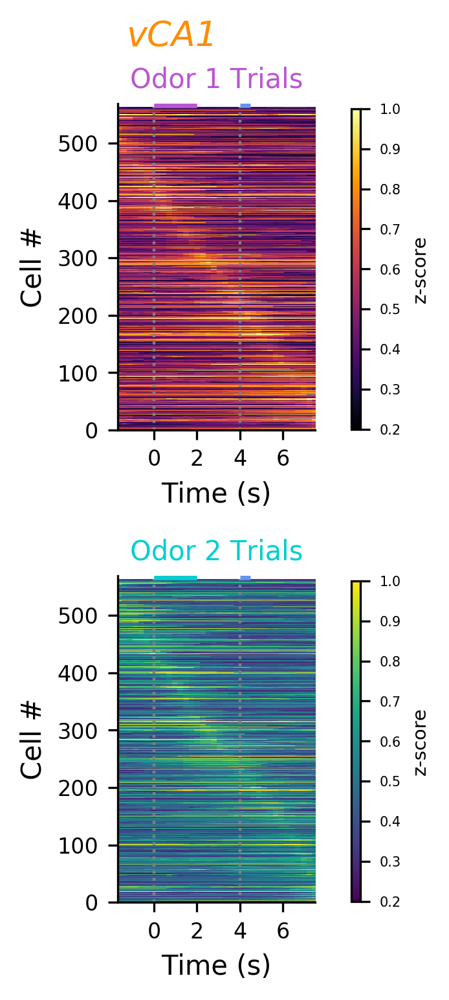

In [552]:
pl.rcParams['axes.xmargin'] = 0
pl.rcParams['axes.ymargin'] = 0
sess='expo'
fig, axs = pl.subplots(2, 1, figsize=(1.85, np.ceil(all_hms_pre_CSm_traces.shape[0]/120.)))
for tt,z in zip(['Rew','CSm'],range(2)):
    funcCSp = lambda x, y: x.imshow(y, aspect='auto', extent=(min_time_ax_single_expo_trunc[0], min_time_ax_single_expo_trunc[-1],0,
                             len(eval("all_hms_%s_%s_traces_trunc"%(sess,tt)))),vmin=0.2, vmax=1, cmap='inferno')
    funcCSm = lambda x, y: x.imshow(y, aspect='auto', extent=(min_time_ax_single_expo_trunc[0], min_time_ax_single_expo_trunc[-1],0, 
                             len(eval("all_hms_%s_%s_traces_trunc"%(sess,tt)))),vmin=0.2, vmax=1, cmap='viridis')
    if tt == 'Rew':
        im=funcCSp(axs[z], eval("all_hms_%s_%s_traces_trunc[sort_%s_%s_traces_trunc]"%(sess,tt,sess,tt)))
    if tt == 'CSm':
        im=funcCSm(axs[z], eval("all_hms_%s_%s_traces_trunc[sort_%s_%s_traces_trunc]"%(sess,tt,sess,tt)))
    axs[z].set_xlabel("Time (s)",fontsize=10)
    axs[z].set_xlim(-1.7,7.5)
    axs[z].set_xticks([0,2,4,6])
    axs[z].set_ylabel("Cell #",fontsize=10)
    for label in (axs[z].get_xticklabels() + axs[z].get_yticklabels()):
        label.set_fontsize(8)
    axs[0].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_traces_trunc"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
    axs[0].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 0, 2, color='mediumorchid', lw=3)
    axs[1].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_traces_trunc"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
    axs[1].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 0, 2, color='darkturquoise', lw=3)
    axs[z].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 4, 4.5, color='cornflowerblue', lw=3)
    #axs[z].tick_params(labelleft=False)
    if tt == 'CSm':
        caxA = fig.add_axes([1,0.112, 0.025, 0.33])
        fig.colorbar(im, cax=caxA, label='z-score')
    if tt == 'Rew':
        cax = fig.add_axes([1,0.598, 0.025, 0.33])
        fig.colorbar(im, cax=cax, label='z-score')
#for i in range(2):
#    axs[z].tick_params(labelleft=False)


# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0].set_title('Odor 1 Trials', fontsize=10,color='mediumorchid')
axs[1].set_title('Odor 2 Trials', fontsize=10,color='darkturquoise')

fig.suptitle("vCA1", fontsize=13, y=1.02,color='darkorange',fontstyle='italic')
fig.tight_layout(pad=1)
fig.savefig('../final-ish figures/%s_sorted_traces_heatmaps_trunc_no_mean_alt_expo.pdf'%(NOTEBOOK_NAME))

In [554]:
test = 'blah1, blah2'
print type(test)

<type 'str'>


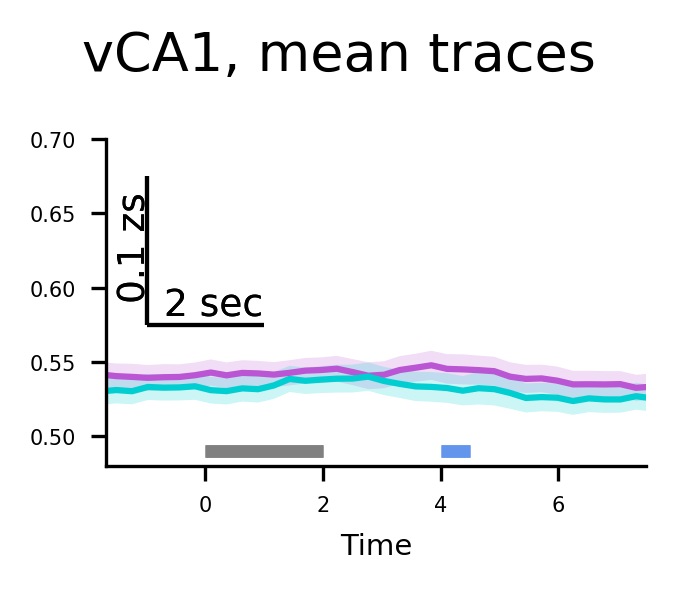

In [553]:
pl.rcParams['axes.xmargin'] = 0
pl.rcParams['axes.ymargin'] = 0
fig, axs = pl.subplots(1, 1, figsize=(2.7, 2))
for sess in 'expo',:
    for tt,z in zip(['Rew','CSm'],['mediumorchid','darkturquoise']):
        axs.plot(eval("min_time_ax_single_%s_trunc"%sess),eval("all_hms_%s_%s_traces_trunc.mean(0)"%(sess,tt)),color=z,lw=1.5)
        m = eval("all_hms_%s_%s_traces_trunc.mean(0)"%(sess,tt))
        sem = eval("all_hms_%s_%s_traces_trunc.std(0)/(math.sqrt(len(all_hms_%s_%s_traces_trunc)))"%(sess,tt,sess,tt))
        axs.fill_between(eval("min_time_ax_single_%s_trunc"%sess),m-sem,m+sem,alpha=0.2,facecolor=z)
        #func = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s_trunc[0]"%sess), eval("min_time_ax_single_%s_trunc[-1]"%sess), 0, 
        #                         len(eval("all_hms_%s_%s_traces_trunc"%(sess,tt)))),vmin=0, vmax=1.5, cmap='inferno')
#
        #im=func(ax, eval("all_hms_%s_%s_traces_trunc[sort_%s_%s_traces_trunc]"%(sess,tt,sess,tt)))
        axs.set_xlabel("Time")
        axs.set_xlim(-1.7,7.5)
        axs.set_xticks([0,2,4,6])
        axs.set_ylim(.48,.7)
        axs.vlines(-1, 0.575, .675, color='k', lw=1)
        axs.text(-1.5,.59,'0.1 zs',rotation=90,ha='left',va='bottom',fontsize=9)
        axs.hlines(.49, 0, 2, color='gray', lw=3)
        axs.hlines(0.575, -1, 1, color='k', lw=1)
        axs.text(-.7,.6,'2 sec',ha='left',va='top',fontsize=9)
        axs.hlines(.49, 4, 4.5, color='cornflowerblue', lw=3)
        #axs.text(-5,len(eval("all_hms_%s_CSm_traces_trunc"%sess))/2+10, "Cell #", fontsize=10, rotation=90)
        #axs.tick_params(labelleft=False)
        #cax = fig.add_axes([1,0.3, 0.01, 0.4])
        #fig.colorbar(im, cax=cax, label='z-score')
##for i in range(2):
##    ax[1].tick_params(left=False,labelleft=False)


# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    axs.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #axs.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

#axs[0][0].set_title('CS+ trials', fontsize=8,color='mediumorchid')
#axs[0][1].set_title('CS- trials', fontsize=8,color='darkturquoise')

fig.suptitle("vCA1, mean traces", fontsize=13, y=1.02)
fig.tight_layout(pad=2)
fig.savefig('../final-ish figures/%s_heatmaps_trunc_mean_only_expo.pdf'%(NOTEBOOK_NAME))




#twin_axs.plot(eval("min_time_ax_single_%s_trunc"%sess),eval("all_hms_%s_%s_traces_trunc.mean(0)"%(sess,tt)),color='w',lw=1.5)
#        m = eval("all_hms_%s_%s_traces_trunc.mean(0)"%(sess,tt))
#        sem = eval("all_hms_%s_%s_traces_trunc.std(0)/(math.sqrt(len(all_hms_%s_%s_traces_trunc)))"%(sess,tt,sess,tt))
#        twin_axs.fill_between(eval("min_time_ax_single_%s_trunc"%sess),m-sem,m+sem,alpha=0.4,color='w',linewidth=1)

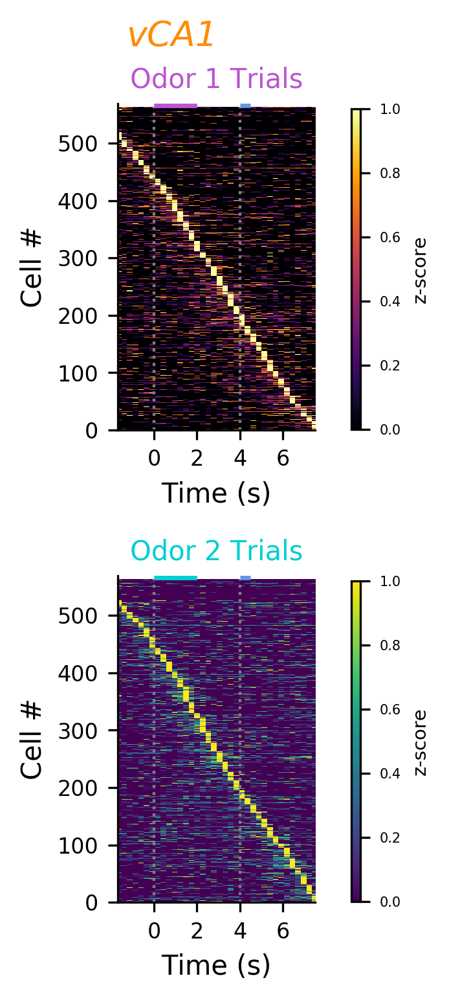

In [490]:
pl.rcParams['axes.xmargin'] = 0
pl.rcParams['axes.ymargin'] = 0
sess='expo'
fig, axs = pl.subplots(2, 1, figsize=(1.85, np.ceil(all_hms_pre_CSm_evs.shape[0]/120.)))
for tt,z in zip(['Rew','CSm'],range(2)):
    funcCSp = lambda x, y: x.imshow(y, aspect='auto', extent=(min_time_ax_single_expo_trunc[0], min_time_ax_single_expo_trunc[-1],0,
                             len(eval("all_hms_%s_%s_evs_trunc"%(sess,tt)))),vmin=0, vmax=1, cmap='inferno')
    funcCSm = lambda x, y: x.imshow(y, aspect='auto', extent=(min_time_ax_single_expo_trunc[0], min_time_ax_single_expo_trunc[-1],0, 
                             len(eval("all_hms_%s_%s_evs_trunc"%(sess,tt)))),vmin=0, vmax=1, cmap='viridis')
    if tt == 'Rew':
        im=funcCSp(axs[z], eval("all_hms_%s_%s_evs_trunc[sort_%s_%s_evs_trunc]"%(sess,tt,sess,tt)))
    if tt == 'CSm':
        im=funcCSm(axs[z], eval("all_hms_%s_%s_evs_trunc[sort_%s_%s_evs_trunc]"%(sess,tt,sess,tt)))
    axs[z].set_xlabel("Time (s)",fontsize=10)
    axs[z].set_xlim(-1.7,7.5)
    axs[z].set_xticks([0,2,4,6])
    axs[z].set_ylabel("Cell #",fontsize=10)
    for label in (axs[z].get_xticklabels() + axs[z].get_yticklabels()):
        label.set_fontsize(8)
    axs[0].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_evs_trunc"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
    axs[0].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 0, 2, color='mediumorchid', lw=3)
    axs[1].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_evs_trunc"%sess)), color=['gray','gray'], lw=1, linestyle='dotted')
    axs[1].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 0, 2, color='darkturquoise', lw=3)
    axs[z].hlines(len(eval("all_hms_%s_CSm_evs_trunc"%sess))+6, 4, 4.5, color='cornflowerblue', lw=3)
    #axs[z].tick_params(labelleft=False)
    if tt == 'CSm':
        caxA = fig.add_axes([1,0.112, 0.025, 0.33])
        fig.colorbar(im, cax=caxA, label='z-score')
    if tt == 'Rew':
        cax = fig.add_axes([1,0.598, 0.025, 0.33])
        fig.colorbar(im, cax=cax, label='z-score')
#for i in range(2):
#    axs[z].tick_params(labelleft=False)


# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0].set_title('Odor 1 Trials', fontsize=10,color='mediumorchid')
axs[1].set_title('Odor 2 Trials', fontsize=10,color='darkturquoise')

fig.suptitle("vCA1", fontsize=13, y=1.02,color='darkorange',fontstyle='italic')
fig.tight_layout(pad=1)
fig.savefig('../final-ish figures/%s_sorted_evs_heatmaps_trunc_no_mean_alt_expo_normalized.pdf'%(NOTEBOOK_NAME))

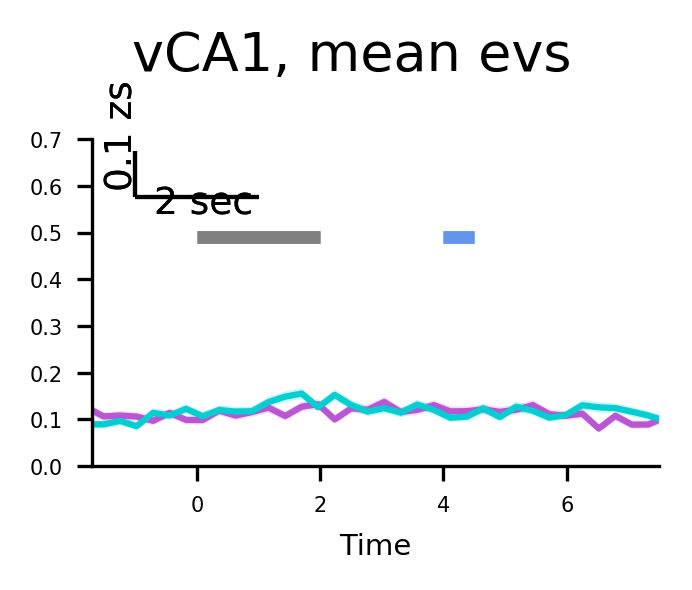

In [492]:
pl.rcParams['axes.xmargin'] = 0
pl.rcParams['axes.ymargin'] = 0
fig, axs = pl.subplots(1, 1, figsize=(2.7, 2))
for sess in 'expo',:
    for tt,z in zip(['Rew','CSm'],['mediumorchid','darkturquoise']):
        axs.plot(eval("min_time_ax_single_%s_trunc"%sess),eval("all_hms_%s_%s_evs_trunc.mean(0)"%(sess,tt)),color=z,lw=1.5)
        m = eval("all_hms_%s_%s_evs_trunc.mean(0)"%(sess,tt))
        sem = eval("all_hms_%s_%s_evs_trunc.std(0)/(math.sqrt(len(all_hms_%s_%s_evs_trunc)))"%(sess,tt,sess,tt))
        axs.fill_between(eval("min_time_ax_single_%s_trunc"%sess),m-sem,m+sem,alpha=0.2,facecolor=z)
        #func = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s_trunc[0]"%sess), eval("min_time_ax_single_%s_trunc[-1]"%sess), 0, 
        #                         len(eval("all_hms_%s_%s_evs_trunc"%(sess,tt)))),vmin=0, vmax=1.5, cmap='inferno')
#
        #im=func(ax, eval("all_hms_%s_%s_evs_trunc[sort_%s_%s_evs_trunc]"%(sess,tt,sess,tt)))
        axs.set_xlabel("Time")
        axs.set_xlim(-1.7,7.5)
        axs.set_xticks([0,2,4,6])
        axs.set_ylim(0,.7)
        axs.vlines(-1, 0.575, .675, color='k', lw=1)
        axs.text(-1.5,.59,'0.1 zs',rotation=90,ha='left',va='bottom',fontsize=9)
        axs.hlines(.49, 0, 2, color='gray', lw=3)
        axs.hlines(0.575, -1, 1, color='k', lw=1)
        axs.text(-.7,.6,'2 sec',ha='left',va='top',fontsize=9)
        axs.hlines(.49, 4, 4.5, color='cornflowerblue', lw=3)
        #axs.text(-5,len(eval("all_hms_%s_CSm_evs_trunc"%sess))/2+10, "Cell #", fontsize=10, rotation=90)
        #axs.tick_params(labelleft=False)
        #cax = fig.add_axes([1,0.3, 0.01, 0.4])
        #fig.colorbar(im, cax=cax, label='z-score')
##for i in range(2):
##    ax[1].tick_params(left=False,labelleft=False)


# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    axs.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #axs.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

#axs[0][0].set_title('CS+ trials', fontsize=8,color='mediumorchid')
#axs[0][1].set_title('CS- trials', fontsize=8,color='darkturquoise')

fig.suptitle("vCA1, mean evs", fontsize=13, y=1.02)
fig.tight_layout(pad=2)
fig.savefig('../final-ish figures/%s_heatmaps_trunc_mean_only_expo_normalized_evs.pdf'%(NOTEBOOK_NAME))




#twin_axs.plot(eval("min_time_ax_single_%s_trunc"%sess),eval("all_hms_%s_%s_evs_trunc.mean(0)"%(sess,tt)),color='w',lw=1.5)
#        m = eval("all_hms_%s_%s_evs_trunc.mean(0)"%(sess,tt))
#        sem = eval("all_hms_%s_%s_evs_trunc.std(0)/(math.sqrt(len(all_hms_%s_%s_evs_trunc)))"%(sess,tt,sess,tt))
#        twin_axs.fill_between(eval("min_time_ax_single_%s_trunc"%sess),m-sem,m+sem,alpha=0.4,color='w',linewidth=1)

In [50]:
##this means nothing w/o cellReg cells
#from scipy import stats as sstats
#
#corrs_CSm = np.r_[[sstats.pearsonr(a1[:min(len(a1), len(a2))], a2[:min(len(a1), len(a2))])[0]
#                 for a1, a2 in zip(all_hms_pre_CSm[sort_pre_CSm], all_hms_post_CSm[sort_pre_CSm])]]
#corrs_Rew = np.r_[[sstats.pearsonr(a1[:min(len(a1), len(a2))], a2[:min(len(a1), len(a2))])[0]
#                 for a1, a2 in zip(all_hms_pre_Rew[sort_pre_Rew], all_hms_post_Rew[sort_pre_Rew])]]
#corrs_Sh = np.r_[[sstats.pearsonr(a1[:min(len(a1), len(a2))], a2[:min(len(a1), len(a2))])[0]
#                 for a1, a2 in zip(all_hms_pre_Sh[sort_pre_Sh], all_hms_post_Sh[sort_pre_Sh])]]
#
#fig, ax = pl.subplots(1, 1, figsize=(2, 1))
#pt.plot_bars([corrs_CSm, corrs_Rew, corrs_Sh], stderr=True, ax=ax)
#pt.add_significance(ax, corrs_CSm, corrs_Rew, 0, 1, 0.2, sig_func=lambda x, y: sstats.kendalltau(x, y))
#pt.nicer_plot(ax)
#ax.set_xticks(range(3))
#ax.set_xticklabels(['CS-', 'Rew', 'Shock'])
#ax.set_ylabel('Tuning correlation\nPRE vs POST')

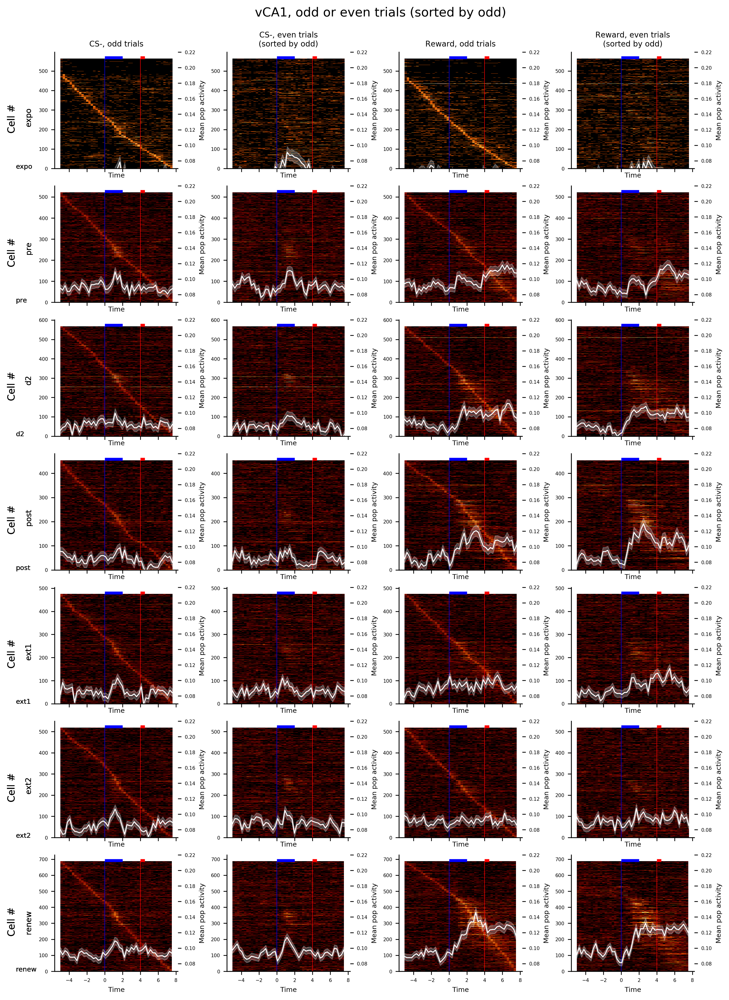

In [51]:
fig, axs = pl.subplots(len(sessions), 4, figsize=(10, np.ceil(all_hms_pre_CSm_evs.shape[0]/40.)), sharex=True)
for sess,i in zip(sessions,range(len(sessions))):
    for tt,eo,z in zip(['CSm','CSm','Rew','Rew'],['odd','even','odd','even'],range(4)):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(eval("min_time_ax_single_%s[0]"%sess), eval("min_time_ax_single_%s[-1]"%sess), 0, 
                                 len(eval("all_hms_%s_%s_evs"%(sess,tt)))),vmin=0, vmax=1, cmap='afmhot')

        func(axs[i][z], eval("all_hms_%s_%s_evs_%s[sort_%s_%s_evs_odd]"%(sess,tt,eo,sess,tt)))
        axs[i][0].text(-10,0, sess, fontsize=7)
        axs[i][z].set_xlabel("Time")
        axs[i][z].vlines([0, 4], 0, len(eval("all_hms_%s_CSm_evs"%sess)), color=['b','r'], lw=.5)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_evs"%sess))+5, 0, 2, color='b', lw=3)
        axs[i][z].hlines(len(eval("all_hms_%s_CSm_evs"%sess))+5, 4, 4.5, color='r', lw=3)
        axs[i][0].text(-9,len(eval("all_hms_%s_CSm_evs"%sess))/2, sess, fontsize=8, rotation=90)
        axs[i][0].text(-11,len(eval("all_hms_%s_CSm_evs"%sess))/2+10, "Cell #", fontsize=10, rotation=90)
        twin_ax = axs[i][z].twinx()
        twin_ax.set_ylabel("Mean pop activity")
        twin_ax.plot(eval("min_time_ax_single_%s"%sess),eval("all_hms_%s_%s_evs_%s.mean(0)"%(sess,tt,eo)),color='w',lw=1)
        m = eval("all_hms_%s_%s_evs_%s.mean(0)"%(sess,tt,eo))
        sem = eval("all_hms_%s_%s_evs_%s.std(0)/(math.sqrt(len(all_hms_%s_%s_evs_%s)))"%(sess,tt,eo,sess,tt,eo))
        twin_ax.fill_between(eval("min_time_ax_single_%s"%sess),m-sem,m+sem,alpha=0.25,color='w',linewidth=1)
        twin_ax.set_ylim(0.07,.22)

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS-, odd trials', fontsize=8)
axs[0][1].set_title('CS-, even trials\n(sorted by odd)', fontsize=8)
axs[0][2].set_title('Reward, odd trials', fontsize=8)
axs[0][3].set_title('Reward, even trials\n(sorted by odd)', fontsize=8)

fig.suptitle("vCA1, odd or even trials (sorted by odd)", fontsize=13, y=1.02)
fig.tight_layout()
fig.savefig('../final-ish figures/%s_sorted_event_heatmaps_EO.pdf'%(NOTEBOOK_NAME))

# 3rd method for assessing activation width (via Vijay)

In [139]:
def filter_cycle_JSB(time_ax, cycles, cycle):
    return (time_ax>=cycles[cycle][0]-2.5) * (time_ax<cycles[cycle][1]+3) #since cycles start -5 and end at +8, but imaged from
#-8 to +11ish, can take up to 3 seconds pre to cycle onset and 3 post offset

def compute_all_dffs_JSB(time_ax, dff, cell, cycles, cycle_filter=lambda x: True):
    return np.r_[[dff[:, cell][filter_cycle_JSB(time_ax, cycles, cycle)][:68] #emprically found that 68 seems to be min # of time bins
                              for cycle in range(len(cycles)) if cycle_filter(cycle)]]

In [181]:
#zscored = True

for sess in sessions:
    exec("all_hms_%s_CSm_evs_JSB=[]"%sess)
    exec("all_hms_%s_Rew_evs_JSB=[]"%sess)
    for animal in eval("%s_animals"%sess):
    #    cellregs = anivars[animal]['cellregs']
        exec("vars_%s = %s_anivars['%s']['vars_%s']"%(sess,sess,animal,sess))
    
        for k in eval("vars_%s.keys()"%sess):
            exec('%s = vars_%s[\'%s\']' % (k,sess,k))
    
        exec("hm_%s_CSm_evs_JSB = np.r_[[compute_all_dffs_JSB(time_ax, events, cell, cycles[is_CSmt])\
                        for cell in range(len(vars_%s['events'][0]))]]"%(sess,sess))
        #exec("hm_%s_CSm_evs_JSB = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_CSm_evs_JSB]]"%(sess,sess))
        exec("hm_%s_CSm_evs_JSB = np.r_[[np.mean(h, 0) for h in hm_%s_CSm_evs_JSB]]"%(sess,sess))
        exec("hm_%s_Rew_evs_JSB = np.r_[[compute_all_dffs_JSB(time_ax, events, cell, cycles[is_rewardt])\
                        for cell in range(len(vars_%s['events'][0]))]]"%(sess,sess))
        #exec("hm_%s_Rew_evs_JSB = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_Rew_evs_JSB]]"%(sess,sess))
        exec("hm_%s_Rew_evs_JSB = np.r_[[np.mean(h, 0) for h in hm_%s_Rew_evs_JSB]]"%(sess,sess))
        print len(eval("hm_%s_Rew_evs_JSB[0]"%(sess))),

        eval("all_hms_%s_CSm_evs_JSB.append(hm_%s_CSm_evs_JSB)"%(sess, sess))
        eval("all_hms_%s_Rew_evs_JSB.append(hm_%s_Rew_evs_JSB)"%(sess, sess))

68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68


In [182]:
#zscored = True

for sess in sessions:
    exec("all_hms_%s_CSm_traces_JSB=[]"%sess)
    exec("all_hms_%s_Rew_traces_JSB=[]"%sess)
    for animal in eval("%s_animals"%sess):
    #    cellregs = anivars[animal]['cellregs']
        exec("vars_%s = %s_anivars['%s']['vars_%s']"%(sess,sess,animal,sess))
    
        for k in eval("vars_%s.keys()"%sess):
            exec('%s = vars_%s[\'%s\']' % (k,sess,k))
    
        exec("hm_%s_CSm_traces = np.r_[[compute_all_dffs_JSB(time_ax, traces, cell, cycles[is_CSmt])\
                        for cell in range(len(vars_%s['traces'][0]))]]"%(sess,sess))
        #exec("hm_%s_CSm_traces = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_CSm_traces]]"%(sess,sess))
        exec("hm_%s_CSm_traces = np.r_[[np.mean(h, 0) for h in hm_%s_CSm_traces]]"%(sess,sess))
        exec("hm_%s_Rew_traces = np.r_[[compute_all_dffs_JSB(time_ax, traces, cell, cycles[is_rewardt])\
                        for cell in range(len(vars_%s['traces'][0]))]]"%(sess,sess))
        #exec("hm_%s_Rew_traces = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_Rew_traces]]"%(sess,sess))
        exec("hm_%s_Rew_traces = np.r_[[np.mean(h, 0) for h in hm_%s_Rew_traces]]"%(sess,sess))
        print len(eval("hm_%s_Rew_traces[0]"%(sess))),
        eval("all_hms_%s_CSm_traces_JSB.append(hm_%s_CSm_traces)"%(sess, sess))
        eval("all_hms_%s_Rew_traces_JSB.append(hm_%s_Rew_traces)"%(sess, sess))

68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68


In [183]:
#zscored = True

for sess in sessions:
    exec("all_hms_%s_CSm_evs_even_JSB=[]"%sess)
    exec("all_hms_%s_Rew_evs_even_JSB=[]"%sess)
    exec("all_hms_%s_CSm_evs_odd_JSB=[]"%sess)
    exec("all_hms_%s_Rew_evs_odd_JSB=[]"%sess)
    for animal in eval("%s_animals"%sess):
    #    cellregs = anivars[animal]['cellregs']
        exec("vars_%s = %s_anivars['%s']['vars_%s']"%(sess,sess,animal,sess))
    
        for k in eval("vars_%s.keys()"%sess):
            exec('%s = vars_%s[\'%s\']' % (k,sess,k))
        
        for eo in 'even','odd':
            exec("hm_%s_CSm_evs_JSB = np.r_[[compute_all_dffs_JSB(time_ax, events, cell, cycles[is_CSmt_%s_%s_%s])\
                            for cell in range(len(vars_%s['events'][0]))]]"%(sess,eo,sess,animal,sess))
            #exec("hm_%s_CSm_evs_JSB = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_CSm_evs_JSB]]"%(sess,sess))
            exec("hm_%s_CSm_evs_JSB = np.r_[[np.mean(h, 0) for h in hm_%s_CSm_evs_JSB]]"%(sess,sess))
            exec("hm_%s_Rew_evs_JSB = np.r_[[compute_all_dffs_JSB(time_ax, events, cell, cycles[is_rewardt_%s_%s_%s])\
                            for cell in range(len(vars_%s['events'][0]))]]"%(sess,eo,sess,animal,sess))
            #exec("hm_%s_Rew_evs_JSB = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_Rew_evs_JSB]]"%(sess,sess))
            exec("hm_%s_Rew_evs_JSB = np.r_[[np.mean(h, 0) for h in hm_%s_Rew_evs_JSB]]"%(sess,sess))
            print len(eval("hm_%s_Rew_evs_JSB[0]"%(sess))),

            eval("all_hms_%s_CSm_evs_%s_JSB.append(hm_%s_CSm_evs_JSB)"%(sess,eo,sess))
            eval("all_hms_%s_Rew_evs_%s_JSB.append(hm_%s_Rew_evs_JSB)"%(sess,eo,sess))

68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68


In [184]:
#zscored = True

for sess in sessions:
    exec("all_hms_%s_CSm_traces_even_JSB=[]"%sess)
    exec("all_hms_%s_Rew_traces_even_JSB=[]"%sess)
    exec("all_hms_%s_CSm_traces_odd_JSB=[]"%sess)
    exec("all_hms_%s_Rew_traces_odd_JSB=[]"%sess)
    for animal in eval("%s_animals"%sess):
    #    cellregs = anivars[animal]['cellregs']
        exec("vars_%s = %s_anivars['%s']['vars_%s']"%(sess,sess,animal,sess))
    
        for k in eval("vars_%s.keys()"%sess):
            exec('%s = vars_%s[\'%s\']' % (k,sess,k))
    
        for eo in 'even','odd':
            exec("hm_%s_CSm_traces = np.r_[[compute_all_dffs_JSB(time_ax, traces, cell, cycles[is_CSmt_%s_%s_%s])\
                            for cell in range(len(vars_%s['traces'][0]))]]"%(sess,eo,sess,animal,sess))
            #exec("hm_%s_CSm_traces = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_CSm_traces]]"%(sess,sess))
            exec("hm_%s_CSm_traces = np.r_[[np.mean(h, 0) for h in hm_%s_CSm_traces]]"%(sess,sess))
            exec("hm_%s_Rew_traces = np.r_[[compute_all_dffs_JSB(time_ax, traces, cell, cycles[is_rewardt_%s_%s_%s])\
                            for cell in range(len(vars_%s['traces'][0]))]]"%(sess,eo,sess,animal,sess))
            #exec("hm_%s_Rew_traces = np.r_[[np.mean(h, 0)/np.std(h, 0) if zscored else np.mean(h, 0)/np.max(h.mean(0)) for h in hm_%s_Rew_traces]]"%(sess,sess))
            exec("hm_%s_Rew_traces = np.r_[[np.mean(h, 0) for h in hm_%s_Rew_traces]]"%(sess,sess))
            print len(eval("hm_%s_Rew_traces[0]"%(sess))),
            
            eval("all_hms_%s_CSm_traces_%s_JSB.append(hm_%s_CSm_traces)"%(sess,eo,sess))
            eval("all_hms_%s_Rew_traces_%s_JSB.append(hm_%s_Rew_traces)"%(sess,eo,sess))

68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68


In [185]:
for sess in sessions:
    for trialtype in ('CSm','Rew'):
        exec("max_t_JSB = np.min([a.shape[1] for a in all_hms_%s_%s_traces_JSB])"%(sess,trialtype))
        exec("all_hms_%s_%s_evs_JSB = np.row_stack([a[:, :max_t_JSB] for a in all_hms_%s_%s_evs_JSB])"%(sess,trialtype,sess,trialtype))
        exec("all_hms_%s_%s_traces_JSB = np.row_stack([a[:, :max_t_JSB] for a in all_hms_%s_%s_traces_JSB])"%(sess,trialtype,sess,trialtype))
        #exec("min_time_ax_single_%s_JSB = (vars_%s['time_ax_single']+9)[:max_t_JSB]"%(sess,sess))
        for eo in 'even','odd':
            exec("all_hms_%s_%s_evs_%s_JSB = np.row_stack([a[:, :max_t_JSB] for a in all_hms_%s_%s_evs_%s_JSB])"%(sess,trialtype,eo,sess,trialtype,eo))
            exec("all_hms_%s_%s_traces_%s_JSB = np.row_stack([a[:, :max_t_JSB] for a in all_hms_%s_%s_traces_%s_JSB])"%(sess,trialtype,eo,sess,trialtype,eo))
    print max_t_JSB

68
68
68
68
68
68
68


In [186]:
#convert nan to 0
for sess in sessions:
    for tt in ('CSm','Rew'):
        exec("all_hms_%s_%s_evs_JSB[np.isnan(all_hms_%s_%s_evs_JSB)]=0"%(sess,tt,sess,tt))
        exec("all_hms_%s_%s_traces_JSB[np.isnan(all_hms_%s_%s_traces_JSB)]=0"%(sess,tt,sess,tt))

In [187]:
for sess in sessions:
    for trialtype in ('CSm','Rew'):
        exec("sort_%s_%s_evs_JSB = np.argsort([np.argmax(h) for h in all_hms_%s_%s_evs_JSB])"%(sess,trialtype,sess,trialtype))
        exec("minsort_%s_%s_evs_JSB = np.argsort([np.argmin(h) for h in all_hms_%s_%s_evs_JSB])"%(sess,trialtype,sess,trialtype))
        exec("sort_%s_%s_traces_JSB = np.argsort([np.argmax(h) for h in all_hms_%s_%s_traces_JSB])"%(sess,trialtype,sess,trialtype))
        exec("minsort_%s_%s_traces_JSB = np.argsort([np.argmin(h) for h in all_hms_%s_%s_traces_JSB])"%(sess,trialtype,sess,trialtype))

In [188]:
#convert nan to 0
for sess in sessions:
    for tt in ('CSm','Rew'):
        for trl in ('even','odd'):
            exec("all_hms_%s_%s_evs_%s_JSB[np.isnan(all_hms_%s_%s_evs_%s_JSB)]=0"%(sess,tt,trl,sess,tt,trl))
            exec("all_hms_%s_%s_traces_%s_JSB[np.isnan(all_hms_%s_%s_traces_%s_JSB)]=0"%(sess,tt,trl,sess,tt,trl))

In [189]:
for sess in sessions:
    for trialtype in ('CSm','Rew'):
        exec("sort_%s_%s_evs_even_JSB = np.argsort([np.argmax(h) for h in all_hms_%s_%s_evs_even_JSB])"%(sess,trialtype,sess,trialtype))
        exec("sort_%s_%s_traces_even_JSB = np.argsort([np.argmax(h) for h in all_hms_%s_%s_traces_even_JSB])"%(sess,trialtype,sess,trialtype))
        exec("sort_%s_%s_evs_odd_JSB = np.argsort([np.argmax(h) for h in all_hms_%s_%s_evs_odd_JSB])"%(sess,trialtype,sess,trialtype))
        exec("sort_%s_%s_traces_odd_JSB = np.argsort([np.argmax(h) for h in all_hms_%s_%s_traces_odd_JSB])"%(sess,trialtype,sess,trialtype))

In [165]:
pre_tbs=15 #how many time bins to examine prior to peak?
post_tbs=15
for sess in sessions:
    for tt in 'CSm','Rew':
        for signal in 'evs','traces':
            exec("odd_peak_even_PETH_%s_%s_%s = []"%(sess,tt,signal))
            for cell,i in zip(eval("all_hms_%s_%s_%s_odd_JSB"%(sess,tt,signal)), range(len(eval("all_hms_%s_%s_%s_odd_JSB"%(sess,tt,signal))))):
                x = np.where(cell == np.max(cell))
                ## exclue peaks that do not have enough time bins to collect
                if x[0][0]>=pre_tbs:
                    if x[0][0] < 68-post_tbs: #68 = total number of time bins
                        #print x[0][0],
                        exec("odd_peak_even_PETH_%s_%s_%s.append(all_hms_%s_%s_%s_even_JSB[i][x[0][0]-pre_tbs:x[0][0]+post_tbs+1])"%(sess,tt,signal,sess,tt,signal))

In [174]:
#next break up into where max is during baseline (tb 31 or before) or during odor-trace period (roughly).
pre_tbs=15 #how many time bins to examine prior to peak?
post_tbs=15
for sess in sessions:
    for tt in 'CSm','Rew':
        for signal in 'evs','traces':
            exec("odd_peak_even_PETH_%s_%s_%s_baseline = []"%(sess,tt,signal))
            exec("odd_peak_even_PETH_%s_%s_%s_trial = []"%(sess,tt,signal))
            for cell,i in zip(eval("all_hms_%s_%s_%s_odd_JSB"%(sess,tt,signal)), range(len(eval("all_hms_%s_%s_%s_odd_JSB"%(sess,tt,signal))))):
                x = np.where(cell == np.max(cell))
                ## exclue peaks that do not have enough time bins to collect
                if x[0][0]>=pre_tbs:
                    if x[0][0] < 68-post_tbs: #68 = total number of time bins
                        #print x[0][0],
                        if x[0][0]<31:
                            #normalize even amplitude wrt peak odd amplitude
                            exec("odd_peak_even_PETH_%s_%s_%s_baseline.append(all_hms_%s_%s_%s_even_JSB[i][x[0][0]-pre_tbs:x[0][0]+post_tbs+1])"%(sess,tt,signal,sess,tt,signal))
                        if x[0][0]>34:
                            if x[0][0]<50:
                                exec("odd_peak_even_PETH_%s_%s_%s_trial.append(all_hms_%s_%s_%s_even_JSB[i][x[0][0]-pre_tbs:x[0][0]+post_tbs+1])"%(sess,tt,signal,sess,tt,signal))

In [190]:
#next break up into where max is during baseline (tb 31 or before) or during odor-trace period (roughly).
#NORMALIZE EVEN ACTIVITY TO PEAK ODD ACTIVITY
pre_tbs=15 #how many time bins to examine prior to peak?
post_tbs=15
for sess in sessions:
    for tt in 'CSm','Rew':
        for signal in 'evs','traces':
            exec("odd_peak_even_PETH_%s_%s_%s_baseline_normed = []"%(sess,tt,signal))
            exec("odd_peak_even_PETH_%s_%s_%s_trial_normed = []"%(sess,tt,signal))
            for cell,i in zip(eval("all_hms_%s_%s_%s_odd_JSB"%(sess,tt,signal)), range(len(eval("all_hms_%s_%s_%s_odd_JSB"%(sess,tt,signal))))):
                x = np.where(cell == np.max(cell))
                ## exclue peaks that do not have enough time bins to collect
                if x[0][0]>=pre_tbs:
                    if x[0][0] < 68-post_tbs: #68 = total number of time bins
                        #print x[0][0],
                        if x[0][0]<31:
                            #normalize even amplitude wrt peak odd amplitude
                            exec("odd_peak_even_PETH_%s_%s_%s_baseline_normed.append(all_hms_%s_%s_%s_even_JSB[i][x[0][0]-pre_tbs:x[0][0]+post_tbs+1]\
                                  /cell[x])"%(sess,tt,signal,sess,tt,signal))
                        if x[0][0]>34:
                            if x[0][0]<50:
                                exec("odd_peak_even_PETH_%s_%s_%s_trial_normed.append(all_hms_%s_%s_%s_even_JSB[i][x[0][0]-pre_tbs:x[0][0]+post_tbs+1]\
                                      /cell[x])"%(sess,tt,signal,sess,tt,signal))

In [12]:
Xs = list(np.linspace(-4,4,31))
fig, axs = pl.subplots(len(sessions), 2, figsize=(5, np.ceil(all_hms_pre_CSm_evs.shape[0]/40.)), sharex=True)
for sess,i in zip(sessions,range(len(sessions))):
    for tt,z in zip(['CSm','Rew'],range(2)):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(-4, 4, 0, len(eval("odd_peak_even_PETH_%s_%s_evs"%(sess,tt)))),
                                     vmin=0, vmax=1.5, cmap='afmhot')

        func(axs[i][z], eval("odd_peak_even_PETH_%s_%s_evs"%(sess,tt)))
        axs[i][0].text(-10,0, sess, fontsize=7)
        axs[i][z].set_xlabel("Time")
        axs[i][0].text(-9,len(eval("odd_peak_even_PETH_%s_%s_evs"%(sess,tt)))/2, sess, fontsize=8, rotation=90)
        axs[i][0].text(-11,len(eval("odd_peak_even_PETH_%s_%s_evs"%(sess,tt)))/2+10, "Cell #", fontsize=10, rotation=90)
        twin_ax = axs[i][z].twinx()
        twin_ax.set_ylabel("Mean pop activity")
        m = list(np.mean(eval("odd_peak_even_PETH_%s_%s_evs"%(sess,tt)),0))
        sem = np.std(eval("odd_peak_even_PETH_%s_%s_evs"%(sess,tt)),0)/(math.sqrt(len(eval("odd_peak_even_PETH_%s_%s_evs"%(sess,tt)))))
        twin_ax.fill_between(Xs,m-sem,m+sem,alpha=0.4,color='w',linewidth=1)
        #twin_ax.plot(Xs,m,color='w',lw=2)
        twin_ax.set_ylim(0.,.3)

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS-', fontsize=8)
axs[0][1].set_title('CS+', fontsize=8)

fig.suptitle("dCA1, events", fontsize=13, y=1.02)
fig.tight_layout()
#fig.savefig('../img/%s_evs_heatmaps.jpg'%(NOTEBOOK_NAME))

AttributeError: 'list' object has no attribute 'shape'

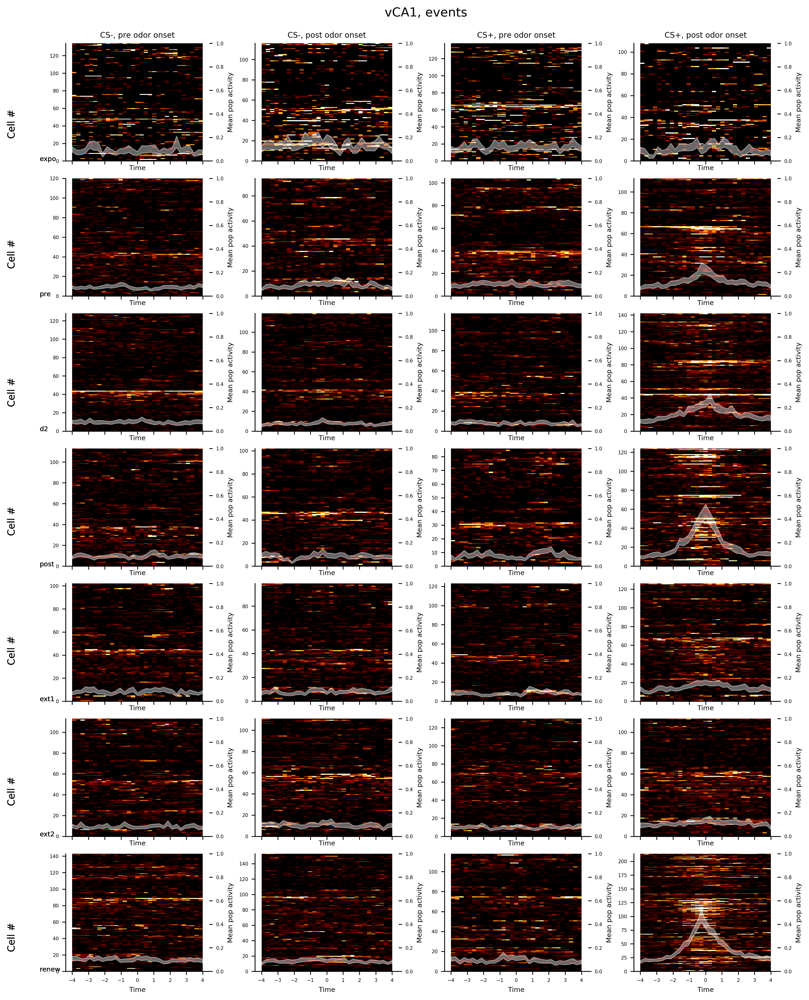

In [227]:
Xs = list(np.linspace(-4,4,31))
fig, axs = pl.subplots(len(sessions), 4, figsize=(11, np.ceil(all_hms_pre_CSm_evs.shape[0]/40.)), sharex=True)
for tt,eo,z in zip(['CSm','CSm','Rew','Rew'],['baseline','trial','baseline','trial'],range(4)):
    for sess,i in zip(sessions,range(len(sessions))):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(-4, 4, 0, len(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)))),
                                     vmin=0, vmax=1.5, cmap='afmhot')

        func(axs[i][z], eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)))
        axs[i][0].text(-6,0, sess, fontsize=7)
        axs[i][z].set_xlabel("Time")
        #axs[i][0].text(-9,len(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)))/2, sess, fontsize=8, rotation=90)
        axs[i][0].text(-8,50, "Cell #", fontsize=10, rotation=90)
        twin_ax = axs[i][z].twinx()
        twin_ax.set_ylabel("Mean pop activity")
        m = list(np.mean(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)),0))
        sem = np.std(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)),0)/(math.sqrt(len(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)))))
        twin_ax.fill_between(Xs,m-sem,m+sem,alpha=0.4,color='w',linewidth=1)
        #twin_ax.plot(Xs,m,color='w',lw=2)
        twin_ax.set_ylim(0.,1)

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS-, pre odor onset', fontsize=8)
axs[0][1].set_title('CS-, post odor onset', fontsize=8)
axs[0][2].set_title('CS+, pre odor onset', fontsize=8)
axs[0][3].set_title('CS+, post odor onset', fontsize=8)

fig.suptitle("vCA1, events", fontsize=13, y=1.02)
fig.tight_layout()
#fig.savefig('../img/%s_evs_heatmaps.jpg'%(NOTEBOOK_NAME))

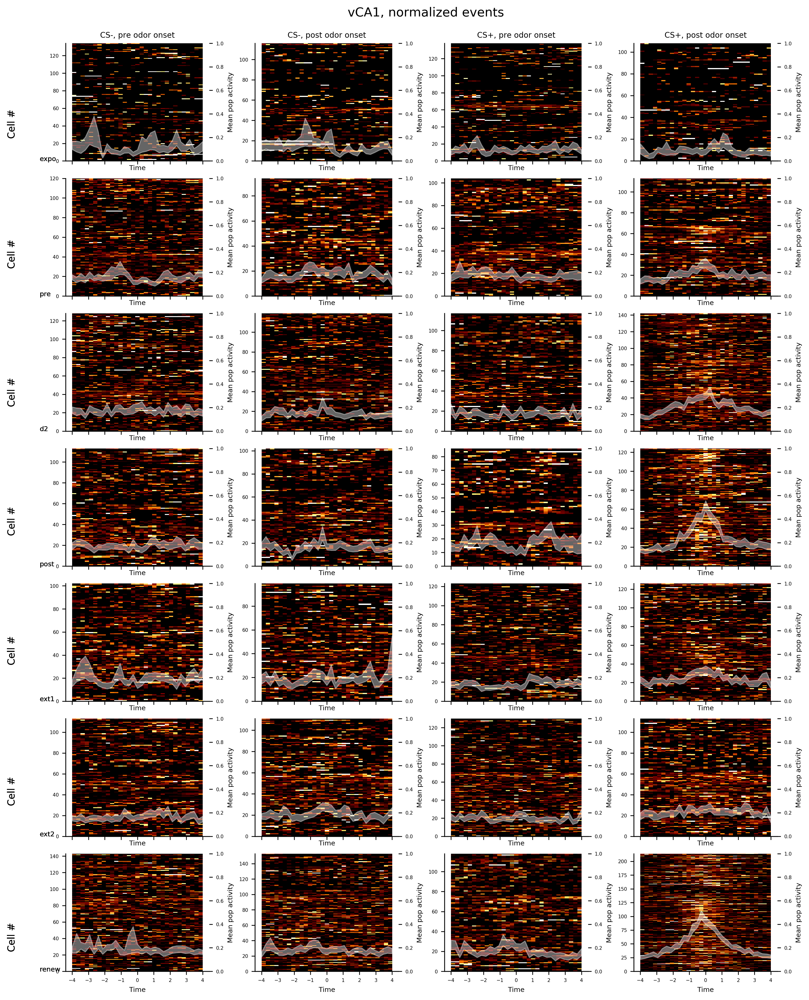

In [226]:
Xs = list(np.linspace(-4,4,31))
fig, axs = pl.subplots(len(sessions), 4, figsize=(11, np.ceil(all_hms_pre_CSm_evs.shape[0]/40.)), sharex=True)
for tt,eo,z in zip(['CSm','CSm','Rew','Rew'],['baseline','trial','baseline','trial'],range(4)):
    for sess,i in zip(sessions,range(len(sessions))):
        func = lambda x, y: x.imshow(y, aspect='auto', extent=(-4, 4, 0, len(eval("odd_peak_even_PETH_%s_%s_evs_%s_normed"%(sess,tt,eo)))),
                                     vmin=0, vmax=1.5, cmap='afmhot')

        func(axs[i][z], eval("odd_peak_even_PETH_%s_%s_evs_%s_normed"%(sess,tt,eo)))
        axs[i][0].text(-6,0, sess, fontsize=7)
        axs[i][z].set_xlabel("Time")
        #axs[i][0].text(-9,len(eval("odd_peak_even_PETH_%s_%s_evs_%s"%(sess,tt,eo)))/2, sess, fontsize=8, rotation=90)
        axs[i][0].text(-8,50, "Cell #", fontsize=10, rotation=90)
        twin_ax = axs[i][z].twinx()
        twin_ax.set_ylabel("Mean pop activity")
        m = list(np.mean(eval("odd_peak_even_PETH_%s_%s_evs_%s_normed"%(sess,tt,eo)),0))
        sem = np.std(eval("odd_peak_even_PETH_%s_%s_evs_%s_normed"%(sess,tt,eo)),0)/(math.sqrt(len(eval("odd_peak_even_PETH_%s_%s_evs_%s_normed"%(sess,tt,eo)))))
        twin_ax.fill_between(Xs,m-sem,m+sem,alpha=0.4,color='w',linewidth=1)
        #twin_ax.plot(Xs,m,color='w',lw=2)
        twin_ax.set_ylim(0.,1)

# axs[0][0].imshow(all_hms_pre1[sort_pre1], aspect='auto', extent=(time_ax_single[0], time_ax_single[-1], 0, len(sort_pre1)),
#                  vmin=0, vmax=1)
#for ax in axs.flatten():
#    #pt.remove_axes(ax)
#    ax.tick_params(
#    axis='x',          # changes apply to the x-axis
#    which='both',      # both major and minor ticks are affected
#    bottom=False,      # ticks along the bottom edge are off
#    top=False,         # ticks along the top edge are off
#    labelbottom=False) # labels along the bottom edge are off
    #ax.vlines([0, 4], 0, len(sort_pre_CSm), color='b', lw=.5)

axs[0][0].set_title('CS-, pre odor onset', fontsize=8)
axs[0][1].set_title('CS-, post odor onset', fontsize=8)
axs[0][2].set_title('CS+, pre odor onset', fontsize=8)
axs[0][3].set_title('CS+, post odor onset', fontsize=8)

fig.suptitle("vCA1, normalized events", fontsize=13, y=1.02)
fig.tight_layout()
#fig.savefig('../img/%s_evs_heatmaps.jpg'%(NOTEBOOK_NAME))

## try to fit each cell with gaussian and then find FWHM

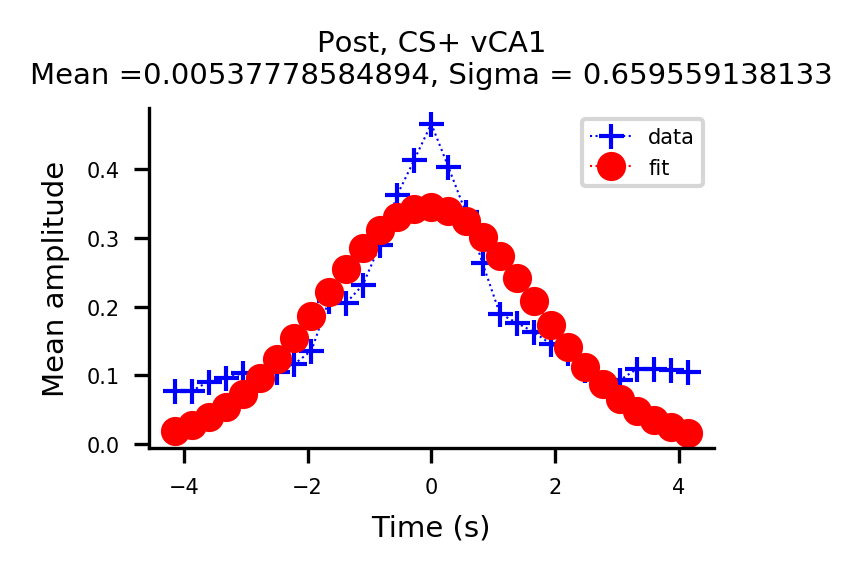

In [241]:
# fitting all cells combined
from scipy.optimize import curve_fit
from scipy import asarray as ar,exp

x = np.linspace(-4.15,4.15,31) # there are 31 time bins spanning roughly 8.3s
y = np.mean(odd_peak_even_PETH_post_Rew_evs_trial,0)

n = len(x)                          #the number of data
mean = sum(x*y)/n                   #I'm not sure this is correct
sigma = sum(y*(x-mean)**2)/n

def gaus(x,a,x0,sigma):
    return a*exp(-(x-x0)**2/(2*sigma**2))

popt,pcov = curve_fit(gaus,x,y,p0=[1,mean,sigma])

pl.plot(x,y,'b+:',label='data')
pl.plot(x,gaus(x,*popt),'ro:',label='fit')
pl.legend()
pl.xlabel('Time (s)')
pl.ylabel('Mean amplitude')
pl.title("Post, CS+ vCA1\nMean ="+str(mean)+", Sigma = "+str(sigma))
pl.show()

In [258]:
#fitting individual cells
x = np.linspace(-4.15,4.15,31) # there are 31 time bins spanning roughly 8.3s
n = len(x)

for y in odd_peak_even_PETH_post_Rew_evs_trial:
    mean = sum(x*y)/n
    sigma = sum(y*(x-mean)**2)/n
    print sigma,

1.22198798905 1.64718994374 0.367427683607 0.598017131712 0.373095894222 0.262432712579 0.83957910395 0.825219159571 0.470237569725 0.430246962475 0.360543985455 0.81124684332 0.199011712213 0.326395030891 0.360592571368 0.0485688616014 0.491844591534 0.951659870739 0.703799773733 0.769022549729 0.62858644433 1.09021964949 0.53886529038 0.526890955164 0.136229170161 0.52158226753 1.86520409232 1.34854461601 1.20268150336 0.980427630088 1.00135833852 0.479366522939 0.247343027233 0.0829424131111 0.397869480846 0.578005601009 0.283885556744 0.26637512226 0.266180380848 0.183925123891 0.471071828625 0.738658178228 0.363328891779 0.399480244866 0.0122208117947 0.281164144319 0.10235747746 0.173902586925 0.195025937087 1.66263900481 0.663894515699 0.99515135673 0.648088330515 0.985253152121 0.92528347656 0.211533788008 1.16148502205 0.488436197122 0.654657122446 0.591073803399 0.417931545713 0.529028648401 0.250718435026 0.377092602366 0.214049340603 0.182484341393 0.338174714613 1.84889147

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 skip 26
27 28 29 30 31 skip 31
32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 skip 59
60 61 62 63 64 skip 64
65 66 skip 66
67 68 69 70 71 72 skip 72
73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 skip 99
100 101 102 103 104 105 106 107 108 109 110 111 112 skip 112
113 114 115 116 117 118 119 120 121 122 123


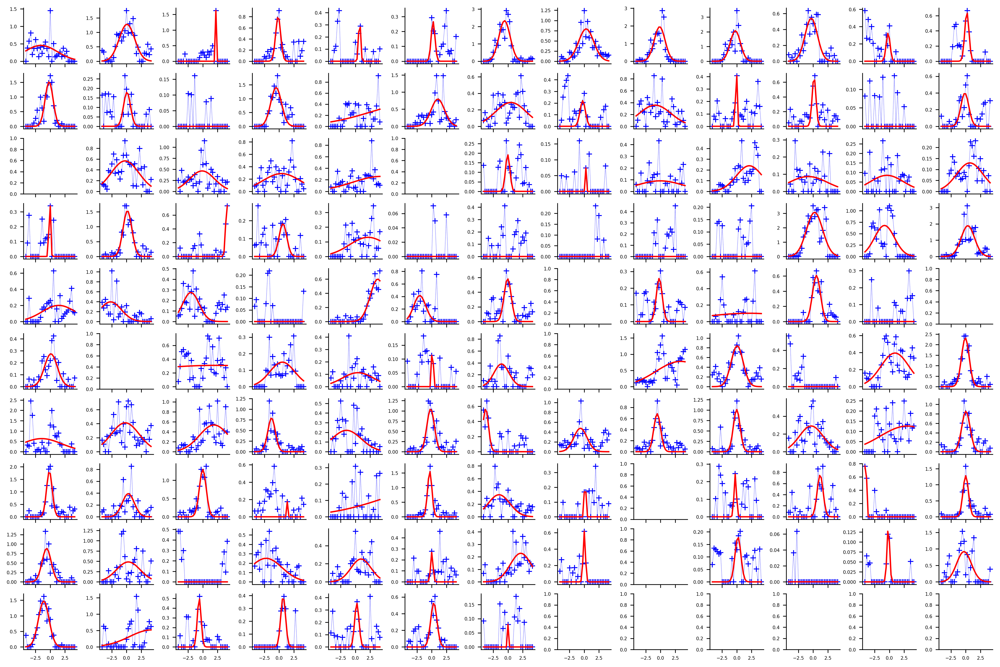

In [291]:
x = np.linspace(-4.15,4.15,31) # there are 31 time bins spanning roughly 8.3s
n = len(x)
r=-1
c=-1

def gaus(x,a,x0,sigma):
    return a*exp(-(x-x0)**2/(2*sigma**2))

fig, axs = pl.subplots(10, 13, figsize=(15,10),sharex=True)

for y, i in zip(odd_peak_even_PETH_post_Rew_evs_trial, range(len(odd_peak_even_PETH_post_Rew_evs_trial))):
    c = c+1
    if i%13 == 0:
        r = r+1
        c = 0
    mean = sum(x*y)/n
    sigma = sum(y*(x-mean)**2)/n
    try:
        popt,pcov = curve_fit(gaus,x,y,p0=[1,mean,sigma])
        axs[r][c].plot(x,y,'b+:',label='data')
        axs[r][c].plot(x,gaus(x,*popt),'r',lw=1.5,label='fit')
        #axs[r][c].legend()
        #axs[r][c].set_xlabel('Time (s)')
        #axs[r][c].set_ylabel('Mean amplitude')
        #axs[r][c].set_title("Post, CS+ vCA1\nMean ="+str(mean)+", Sigma = "+str(sigma))
    except:
        print 'skip %s'%i
fig.tight_layout()

In [ ]:
save_workspace(db)

Could not store variable 'di'. Skipping...
Could not store variable 'IPython'. Skipping...
Could not store variable 'pt'. Skipping...
Could not store variable 'sstats'. Skipping...
Could not store variable 'pl'. Skipping...
Could not store variable 'pickle'. Skipping...
Could not store variable 'ip'. Skipping...
Could not store variable 'sys'. Skipping...
